In [1]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from Bio import PDB
import seaborn as sns
import json
import re
from io import StringIO
from Bio.SeqUtils import seq1
%matplotlib widget
import IPython
from IPython.core.display import Image
from Bio import pairwise2
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio.Align import MultipleSeqAlignment
from Bio.Align import AlignInfo
from sklearn.cluster import KMeans
from Bio import SeqIO
from Bio.Align.Applications import ClustalOmegaCommandline

In [10]:
def colorprint(text, color):
    colors = {
        'red': '\033[91m',
        'green': '\033[92m',
        'yellow': '\033[93m',
        'blue': '\033[94m',
        'magenta': '\033[95m',
        'cyan': '\033[96m',
        'white': '\033[97m',
        'bold': '\033[1m',
        'underline': '\033[4m',
        'end': '\033[0m',
        'light_red': '\033[31m',
        'light_green': '\033[32m',
        'light_yellow': '\033[33m',
        'light_blue': '\033[34m',
        'light_magenta': '\033[35m',
        'light_cyan': '\033[36m',
        'light_gray': '\033[37m',
        'dark_gray': '\033[90m',
        'blink': '\033[5m',
        'reverse': '\033[7m',
        'hidden': '\033[8m',
        'bg_red': '\033[41m',
        'bg_green': '\033[42m',
        'bg_yellow': '\033[43m',
        'bg_blue': '\033[44m',
        'bg_magenta': '\033[45m',
        'bg_cyan': '\033[46m',
        'bg_light_gray': '\033[47m',
        'bg_dark_gray': '\033[100m',
        'bg_light_red': '\033[101m',
        'bg_light_green': '\033[102m',
        'bg_light_yellow': '\033[103m',
        'bg_light_blue': '\033[104m',
        'bg_light_magenta': '\033[105m',
        'bg_light_cyan': '\033[106m',
        'bg_white': '\033[107m'
    }
    if color in colors:
        print(colors[color] + text + colors['end'])
    else:
        print(text) 

        
from functools import wraps
from time import time

def measure(func):
    @wraps(func)
    def _time_it(*args, **kwargs):
        start = time()
        try:
            return func(*args, **kwargs)
        finally:
            end_ = time() - start
            mins, secs = divmod(end_, 60)
            print(f"Total execution time: {mins:.0f} mins {secs:.2f} secs")
    return _time_it


In [2]:
## import paths

input_dir = os.getcwd()+'\\'          # current working directory of input
output_dir = input_dir+'outdir\\'     # current output folder to store output of this notebook  

# Path to the Clustal Omega executable
clustalo_exe = input_dir+"clustal-omega-1.2.2-win64\\clustalo.exe"  # Update this with the actual path to clustalo.exe

## load the sequence data and look at the sequence lengths

In [3]:
seq_file = pd.read_csv(input_dir+'\\test data scientist shuffled sequences BioStrand.csv', index_col=0, header=0)
seq_file['seq_len'] = [len(x) for x in seq_file['original_sequence']]
print(seq_file)

                                     original_sequence  seq_len
id                                                             
0    GLSDGEWQQVLNVWGKVEADIAGHGQEVLIRLFTGHPETLEKFDKF...      153
1    QSVLTQPPSVSGAPGQRVTISCTGSRSNMGAGYDVHWYQLLPGAAP...      217
2    VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFG...      146
3    MHGQVDSSPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQ...      163
4    MHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPHTQRFFESFG...      146
..                                                 ...      ...
406  GSHMPKRGRPAATEVKIPKPRGRPPLPAGTNSKGPPDFSSDEEREP...      364
407  CVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSSVLHSTQDLFLPFFS...     1274
408  MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...      154
409  VQLSGEEKAAVLALWDKVNEEEVGGEALGRLLVVYPWTQRFFDSFG...      145
410  MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...      154

[411 rows x 2 columns]


## reading clusters computed by CDhit and the input fasta file

In [4]:
read_fasta_seq_all = SeqIO.parse(input_dir+'CDhit\\1711655125.fas.0', "fasta")
read_fasta_seq_ref = SeqIO.parse(input_dir+'CDhit\\1711655125.fas.1', "fasta")
fasta_sequences_all = {seq_record.id: seq_record.seq for seq_record in read_fasta_seq_all}
fasta_sequences_ref = {seq_record.id: seq_record.seq for seq_record in read_fasta_seq_ref}
print('TOTAL REFERENCE SEQUENCES', len(fasta_sequences_ref.keys()))
print('TOTAL SEQUENCES', len(fasta_sequences_all.keys()))

TOTAL REFERENCE SEQUENCES 45
TOTAL SEQUENCES 411


In [5]:
# for i, j in fasta_sequences_ref.items():
#     print(f'>{i}')
#     print(j)

In [6]:
import re

def read_cluster_file(filename):
    clusters = []
    with open(filename, 'r') as file:
        current_cluster = None
        for line in file:
            line = line.strip()
            if line.startswith('>'):
                if current_cluster is not None:
                    clusters.append(current_cluster)
                current_cluster = {'Cluster': line.split('>')[1], 'Data': [], 'Reference': []}
            else:
                parts = line.split('\t')
                sequence_info = parts[1].split('... at ')
#                 print(len(sequence_info))
                if len(sequence_info) < 2:
                    current_cluster['Reference'].append([int(sequence_info[0].split(',')[0][:-2]), sequence_info[0].split('>')[1], 'reference'])
                elif len(sequence_info) == 2:
                    identity = float(re.findall(r'\d+\.\d+', sequence_info[1])[0])
#                     print(type(identity))
#                     print(float(identity))
                    current_cluster['Data'].append([int(sequence_info[0].split(',')[0][:-2]), sequence_info[0].split('>')[1], float(identity)])
        if current_cluster is not None:
            clusters.append(current_cluster)
    return clusters

filename = input_dir+'CDhit\\1711655125.fas.1.clstr.sorted'
cluster_data = read_cluster_file(filename)



### create a dataframe from all the clusters including sequence and identity info
### create a dataframe of reference sequences in each cluster

In [7]:
clusters_dict = {}
reference_ids = []
for cluster in cluster_data:
#     print(cluster['Cluster'])
    # Define column names
    
    ref_list = cluster['Reference'][0]
    seq_id_ref = int(ref_list[1].split('... *')[0].split('_')[1])
#     print(seq_id_ref)
    ref_list.append(cluster['Cluster'])
    ref_list.append(seq_id_ref)
    ref_list.append(str(fasta_sequences_ref[f'sequence_{seq_id_ref}']))
#     print(fasta_sequences[f'sequence_{seq_id_ref}'])
#     print(ref_list)
    reference_ids.append(ref_list)
#     # Create DataFrame
    try:
        print(cluster['Cluster'])
        columns = ['seq_len (aa)', 'seq_id', 'identity (%)']
        df = pd.DataFrame(cluster['Data'], columns=columns)
        df['cluster_id'] = [cluster['Cluster'] for i in df.index]
        df['sequence_id'] = [int(x.split('_')[1]) for x in df['seq_id']]
# #         print(df)
        df['sequence'] = [''.join(fasta_sequences_all[f'sequence_{x}']) for x in df['sequence_id']]
#         print(df.head())
#         print()
#         print([fasta_sequences[f'sequence_{x}'] for x in df['sequence_id']])
        clusters_dict.update({cluster['Cluster']: df})
    except:
        pass

Cluster 0
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Cluster 6
Cluster 7
Cluster 8
Cluster 9
Cluster 10
Cluster 11
Cluster 12
Cluster 13
Cluster 14
Cluster 15
Cluster 16
Cluster 17
Cluster 18
Cluster 19
Cluster 20
Cluster 21
Cluster 22
Cluster 23
Cluster 24
Cluster 25
Cluster 26
Cluster 27
Cluster 28
Cluster 29
Cluster 30
Cluster 31
Cluster 32
Cluster 33
Cluster 34
Cluster 35
Cluster 36
Cluster 37
Cluster 38
Cluster 39
Cluster 40
Cluster 41
Cluster 42
Cluster 43
Cluster 44


In [11]:
reference_df = pd.DataFrame([x for x in reference_ids])
reference_df.columns = ['seq_len (aa)', 'seq_id', 'identity (%)', 'cluster_id', 'sequence_id', 'sequence']
reference_df


,seq_len (aa),seq_id,identity (%),cluster_id,sequence_id,sequence
0,163,sequence_180... *,reference,Cluster 0,180,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...
1,147,sequence_26... *,reference,Cluster 1,26,MVHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPWTQRFFESF...
2,157,sequence_17... *,reference,Cluster 2,17,GSHMGLSDGEWQLVLNVWGKVEADVAGHGQEVLIRLFTGHPETLEK...
3,243,sequence_115... *,reference,Cluster 3,115,KLAATMVLQTQVFISLLLWISGAYGQSVLTQPPSASGTPGQRVTIS...
4,220,sequence_54... *,reference,Cluster 4,54,QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAP...
5,183,sequence_210... *,reference,Cluster 5,210,MGSSHHHHHHSSGLVPRGSHMHGQVDCSPGIWQLDCTHLEGKVILV...
6,1310,sequence_332... *,reference,Cluster 6,332,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...
7,383,sequence_141... *,reference,Cluster 7,141,MGSSHHHHHHSSGLVPRGSHMATVKFKYKGEEKEVDISKIKKVWRV...
8,221,sequence_349... *,reference,Cluster 8,349,QSVLTQPPSVSAAPGQKVTISCSGSSSNIGNDYVSWYQQLPGTAPK...
9,146,sequence_3... *,reference,Cluster 9,3,VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFG...


In [12]:
plt.close('all')
identity_all_clusters = {}
for i in clusters_dict.keys():
    print(i)
#     print('REFERENCE SEQUENCE')
    colorprint(reference_df[reference_df['cluster_id'] == i]['sequence'].values[0], 'blue')
    list_seq = clusters_dict[i]['sequence_id']
#     print(list_seq)
    
    clusterseq_df = clusters_dict[i]
    
#     print(clusterseq_df.head())
#     print(len(clusterseq_df['sequence'].unique()), clusterseq_df.shape[0])
#     for id_ in list_seq:
# #         print(id_)
#         index_orig = id_ - 1
#     #         
#         colorprint(clusterseq_df[clusterseq_df['sequence_id'] == id_]['sequence'].values[0], 'green')
#         colorprint(seq_file.iloc[index_orig]['original_sequence'], 'red')
#         print()
    
#     print()


Cluster 0
MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDRFKHLKTEAEMKASEDLKKHGVTVLTALGAILKKKGHHEAELKPLAQSHATKHKIPIKYLEFISEAIIHVLHSRHPGDFGADAQGAMNKALELFRKDIAAKYKELGYQGGSGHHHHHH
Cluster 1
MVHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPWTQRFFESFGDLSTPDAVMGNPKVKAHGKKVLGAFSDGLAHLDNLKGTFATLSELHCDKLHVDPENFRLLGNVLVCVLAHHFGKEFTPPVQAAYQKVVAGVANALAHKYH
Cluster 2
GSHMGLSDGEWQLVLNVWGKVEADVAGHGQEVLIRLFTGHPETLEKFDKFKHLKTEDEMKASEDLKKHGNTVLTALGGILKKKGHHEAELKPLAQSHATKHKIPIKYLEFISDAIIHVLQSKHPGDFGADAQGAMNKALELFRNDIAAKYKELGFQG
Cluster 3
KLAATMVLQTQVFISLLLWISGAYGQSVLTQPPSASGTPGQRVTISCSGSSSNIGTNTVNWYQQLPGTAPKLLIYRNYQRPSGVPDRFSGSKSGTSASLAISGLRSEDEADYYCAAWDDSLSGPHVVFGGGTKLTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECS
Cluster 4
QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAPKLLISGNSNRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDSSLSGSVFGGGTKLTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECSARQ
Cluster 5
MGSSH

In [13]:
identity_all_clusters = pd.DataFrame({x: y['identity (%)'] for x, y in clusters_dict.items()})
print(identity_all_clusters)

    Cluster 0  Cluster 1  Cluster 2  Cluster 3  Cluster 4  Cluster 5  \
0       98.70      98.63      92.81      93.06      94.01      96.32   
1       98.70      98.63      94.12      95.31      95.39     100.00   
2       96.75      98.63      94.77      94.42      94.47      96.99   
3       98.70      99.32      94.77      95.37      93.27      95.83   
4       98.70      98.63      90.85      93.06      96.31      97.60   
..        ...        ...        ...        ...        ...        ...   
91     100.00        NaN        NaN        NaN        NaN        NaN   
92      98.68        NaN        NaN        NaN        NaN        NaN   
93      98.04        NaN        NaN        NaN        NaN        NaN   
94      98.70        NaN        NaN        NaN        NaN        NaN   
95      98.70        NaN        NaN        NaN        NaN        NaN   

    Cluster 6  Cluster 7  Cluster 8  Cluster 9  ...  Cluster 13  Cluster 14  \
0       96.24      97.39      91.36      92.47  ...     

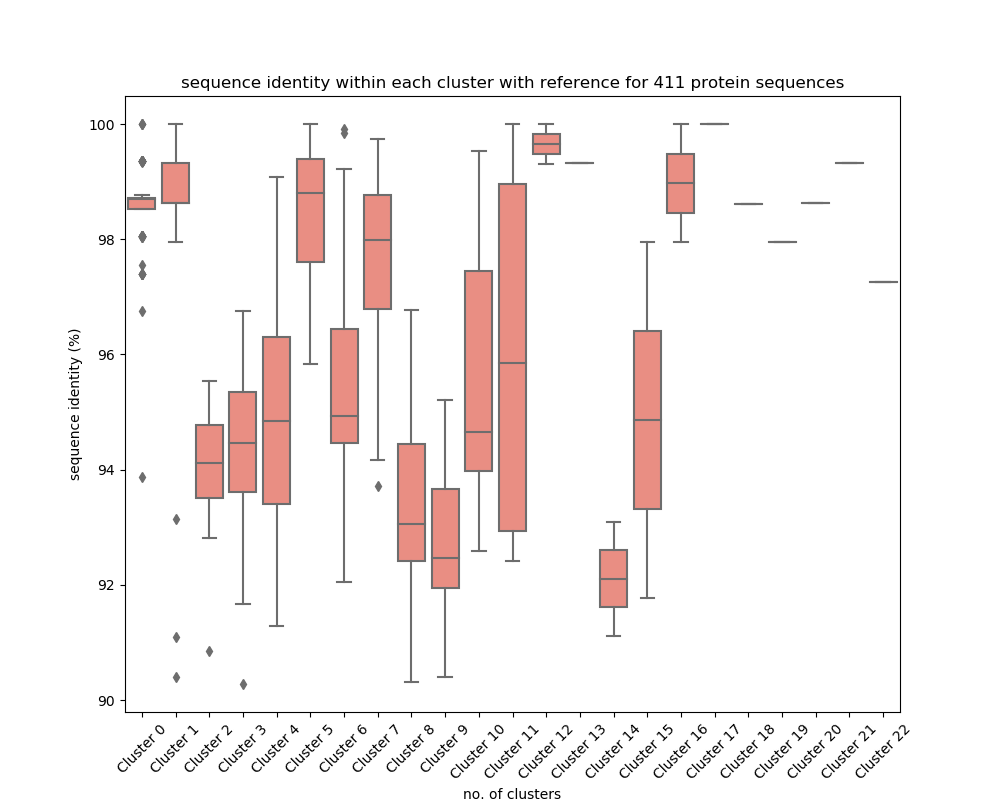

In [14]:
plt.close()
# for x in identity_all_clusters.columns:
# Convert the DataFrame to long format
identity_all_clusters_long = identity_all_clusters.melt(var_name='Columns', value_name='Values')
# print(identity_all_clusters_long)

fig, ax = plt.subplots(figsize=(10, 8))
# Create a boxplot with multiple columns using Seaborn
sns.boxplot(data=identity_all_clusters_long, x='Columns', y='Values', color='salmon')

# Set plot title and labels
ax.set_title('sequence identity within each cluster with reference for 411 protein sequences')
ax.set_ylabel('sequence identity (%)')
ax.set_xlabel('no. of clusters')
plt.xticks(rotation=45,fontsize=10)
# plt.xticklabels(fontsize=10)

plt.savefig(input_dir+'cluster_similarity.png', bbox_inches='tight')
plt.show()

In [601]:
reference_df.iloc[17]

seq_len (aa)                                                  235
seq_id                                          sequence_312... *
identity (%)                                            reference
cluster_id                                             Cluster 17
sequence_id                                                   312
sequence        MAGFPLLLTLLTHCAGSWAQSVLTQPPSASGTPGQSVNISCSGSSS...
Name: 17, dtype: object

# read MSA

In [15]:
muscle_msa_ref = pd.read_csv(input_dir+'MUSCLE\\output2_ref_seq\\muscle-I20240329-191032-0822-93888983-p1m-pim.txt', skiprows=4, delimiter='\t')
print(muscle_msa_ref)

                                                    #
0        1: sequence_316  100.00   10.07   10.79  ...
1        2: sequence_41    10.07  100.00   74.39  ...
2        3: sequence_407   10.79   74.39  100.00  ...
3        4: sequence_141   10.79   72.57   81.89  ...
4        5: sequence_210   12.84   69.40   89.07  ...
5        6: sequence_232   13.70   10.48    9.09  ...
6        7: sequence_304   10.49    8.64    7.82  ...
7        8: sequence_390   13.85   21.53   19.44  ...
8        9: sequence_3     13.08   22.22   22.92  ...
9       10: sequence_70    12.21   20.69   19.31  ...
10      11: sequence_384   13.85   19.44   18.06  ...
11      12: sequence_10    11.54   18.06   17.36  ...
12      13: sequence_340   11.54   20.14   18.75  ...
13      14: sequence_13    10.00   20.83   20.83  ...
14      15: sequence_285   12.31   22.92   22.92  ...
15      16: sequence_278   12.31   16.67   15.28  ...
16      17: sequence_15    13.18   18.18   16.78  ...
17      18: sequence_245   1

In [16]:
row_ = {}
for x in muscle_msa_ref.index:
    filtered_row = [item for item in muscle_msa_ref.iloc[x].values[0].split(':')[1].split(' ') if item != '']
    filtered_row_num = [float(x) for x in filtered_row[1:]]
#     print(filtered_row_num)
    row_.update({filtered_row[0]: filtered_row_num})
#     break

In [17]:
muscle_df_ref = pd.DataFrame(row_).T
muscle_df_ref.columns = muscle_df_ref.index
muscle_df_ref

,sequence_316,sequence_41,sequence_407,sequence_141,sequence_210,sequence_232,sequence_304,sequence_390,sequence_3,sequence_70,...,sequence_345,sequence_92,sequence_349,sequence_44,sequence_185,sequence_312,sequence_115,sequence_120,sequence_287,sequence_54
sequence_316,100.00,10.07,10.79,10.79,12.84,13.70,10.49,13.85,13.08,12.21,...,4.58,3.85,4.51,4.58,3.85,5.34,4.58,5.34,3.82,3.79
sequence_41,10.07,100.00,74.39,72.57,69.40,10.48,8.64,21.53,22.22,20.69,...,13.14,13.79,13.71,11.49,13.22,11.40,12.44,11.33,11.92,13.71
sequence_407,10.79,74.39,100.00,81.89,89.07,9.09,7.82,19.44,22.92,19.31,...,12.57,12.64,13.14,12.07,12.64,12.44,12.44,12.32,12.44,14.29
sequence_141,10.79,72.57,81.89,100.00,89.07,9.09,7.82,18.75,22.22,18.62,...,13.14,13.22,13.71,12.64,13.22,12.95,12.94,12.81,12.95,14.86
sequence_210,12.84,69.40,89.07,89.07,100.00,8.72,7.91,19.61,23.53,21.36,...,12.70,12.80,13.49,12.00,12.00,12.86,12.68,12.06,12.86,15.08
sequence_232,13.70,10.48,9.09,9.09,8.72,100.00,9.61,17.81,18.49,18.37,...,14.49,14.56,12.92,16.02,14.56,15.05,15.46,15.46,13.59,14.98
sequence_304,10.49,8.64,7.82,7.82,7.91,9.61,100.00,18.62,20.69,21.23,...,15.22,14.21,14.36,13.66,14.21,14.36,14.76,13.88,13.37,13.59
sequence_390,13.85,21.53,19.44,18.75,19.61,17.81,18.62,100.00,76.03,69.18,...,15.22,15.33,15.00,16.79,16.06,16.79,18.84,18.12,16.06,16.06
sequence_3,13.08,22.22,22.92,22.22,23.53,18.49,20.69,76.03,100.00,71.23,...,15.94,16.79,16.43,16.06,16.79,16.06,17.39,17.39,16.06,16.06
sequence_70,12.21,20.69,19.31,18.62,21.36,18.37,21.23,69.18,71.23,100.00,...,18.71,20.29,17.73,20.29,19.57,19.57,20.86,19.42,18.84,18.84


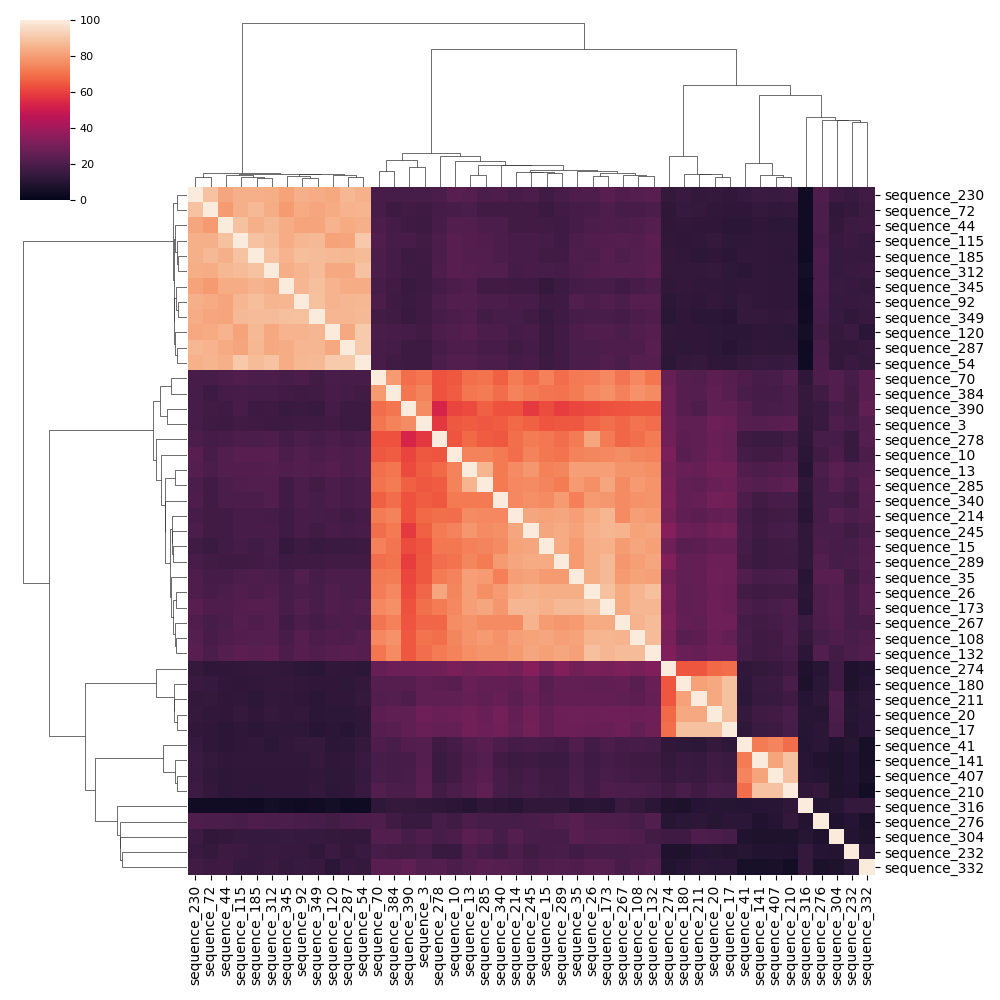

In [18]:
plt.close('all')
sns.clustermap(muscle_df_ref, vmin=0, vmax=100, row_cluster=True, col_cluster=True, yticklabels=1, xticklabels=1)

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

In [19]:
muscle_msa_all = pd.read_csv(input_dir+'MUSCLE\\output1_all_seq\\muscle-I20240328-194746-0627-19218052-p1m-pim.txt', skiprows=4, delimiter='\t')
print(muscle_msa_all)
row_2 = {}
for x in muscle_msa_all.index:
    filtered_row = [item for item in muscle_msa_all.iloc[x].values[0].split(':')[1].split(' ') if item != '']
    filtered_row_2num = [float(x) for x in filtered_row[1:]]
#     print(filtered_row_2num)
    row_2.update({filtered_row[0]: filtered_row_2num})
#     break

muscle_df_all = pd.DataFrame(row_2).T
muscle_df_all.columns = muscle_df_all.index
muscle_df_all

                                                     #
0         1: sequence_316  100.00    8.96    8.28  ...
1         2: sequence_232    8.96  100.00    8.64  ...
2         3: sequence_304    8.28    8.64  100.00  ...
3         4: sequence_174   12.14    5.86    8.58  ...
4         5: sequence_189   12.14    5.86    8.58  ...
..                                                 ...
406     407: sequence_110   10.45   14.21   16.59  ...
407     408: sequence_99    10.45   14.66   16.50  ...
408     409: sequence_324   10.45   14.66   16.50  ...
409     410: sequence_345   11.19   15.18   16.02  ...
410     411: sequence_402   11.94   15.18   16.02  ...

[411 rows x 1 columns]


,sequence_316,sequence_232,sequence_304,sequence_174,sequence_189,sequence_31,sequence_41,sequence_66,sequence_109,sequence_40,...,sequence_349,sequence_320,sequence_224,sequence_313,sequence_373,sequence_110,sequence_99,sequence_324,sequence_345,sequence_402
sequence_316,100.00,8.96,8.28,12.14,12.14,12.14,12.14,10.94,10.94,10.94,...,10.14,11.19,10.45,10.45,10.45,10.45,10.45,10.45,11.19,11.94
sequence_232,8.96,100.00,8.64,5.86,5.86,5.86,5.86,6.41,5.77,6.58,...,14.14,14.66,14.74,14.66,14.74,14.21,14.66,14.66,15.18,15.18
sequence_304,8.28,8.64,100.00,8.58,8.58,8.58,8.58,9.82,9.82,10.06,...,16.19,16.50,16.59,16.50,16.59,16.59,16.50,16.50,16.02,16.02
sequence_174,12.14,5.86,8.58,100.00,98.97,99.31,99.30,69.78,69.23,76.83,...,10.47,10.16,10.22,10.16,9.95,10.11,10.16,10.16,9.63,10.16
sequence_189,12.14,5.86,8.58,98.97,100.00,99.65,99.65,70.88,70.33,78.05,...,10.99,10.70,10.75,10.70,10.47,10.64,10.70,10.70,10.16,10.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sequence_110,10.45,14.21,16.59,10.11,10.64,10.11,10.27,9.94,9.94,10.26,...,95.37,97.22,95.35,96.30,95.85,100.00,96.28,98.15,90.28,91.20
sequence_99,10.45,14.66,16.50,10.16,10.70,10.16,10.33,9.38,9.38,9.62,...,95.37,94.91,94.88,95.37,96.28,96.28,100.00,97.22,90.28,90.28
sequence_324,10.45,14.66,16.50,10.16,10.70,10.16,10.33,10.00,10.00,10.26,...,96.77,96.77,97.22,98.16,98.15,98.15,97.22,100.00,89.40,90.78
sequence_345,11.19,15.18,16.02,9.63,10.16,9.63,9.78,10.62,10.00,10.26,...,89.40,91.71,89.81,89.40,88.43,90.28,90.28,89.40,100.00,93.09


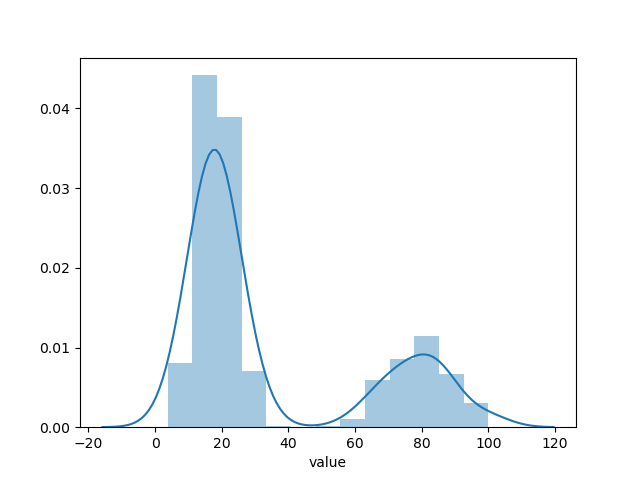

In [19]:
plt.close()
p = pd.melt(muscle_df)
sns.distplot(p['value'])
plt.show()

In [22]:

# print(indices_ref)
indices_all = ['sequence_'+format(i) for i in range(1, 412)]

# # indices
sorted_muscle_df =  muscle_df_all.loc[indices_all, indices_all]
sorted_muscle_df

,sequence_1,sequence_2,sequence_3,sequence_4,sequence_5,sequence_6,sequence_7,sequence_8,sequence_9,sequence_10,...,sequence_402,sequence_403,sequence_404,sequence_405,sequence_406,sequence_407,sequence_408,sequence_409,sequence_410,sequence_411
sequence_1,100.00,13.25,24.83,13.10,25.52,88.24,84.31,12.86,84.31,24.83,...,10.00,11.33,25.52,83.66,12.41,13.16,11.18,84.31,25.00,83.66
sequence_2,13.25,100.00,17.93,10.26,20.00,12.58,13.16,10.27,13.16,20.00,...,82.87,84.72,19.31,13.25,10.06,12.77,23.04,13.16,20.14,13.16
sequence_3,24.83,17.93,100.00,15.17,66.44,26.21,23.97,15.11,23.97,65.07,...,17.93,17.93,66.44,22.76,14.48,15.75,14.48,23.97,68.28,24.66
sequence_4,13.10,10.26,15.17,100.00,16.55,14.48,15.75,95.42,15.07,15.86,...,11.61,9.03,16.55,15.17,95.71,91.41,9.26,15.75,14.58,15.75
sequence_5,25.52,20.00,66.44,16.55,100.00,26.21,24.66,15.83,24.66,73.29,...,19.31,20.00,98.63,22.76,15.86,17.12,15.17,24.66,82.07,25.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sequence_407,13.16,12.77,15.75,91.41,17.12,13.82,15.03,97.39,14.38,14.38,...,13.37,11.23,17.12,14.47,93.37,100.00,9.97,15.03,15.17,15.03
sequence_408,11.18,23.04,14.48,9.26,15.17,9.87,11.76,10.53,11.76,15.86,...,24.42,25.93,15.86,11.84,9.70,9.97,100.00,11.76,15.28,11.11
sequence_409,84.31,13.16,23.97,15.75,24.66,84.31,99.35,15.00,97.40,22.60,...,10.60,11.92,24.66,96.73,14.38,15.03,11.76,100.00,23.45,98.70
sequence_410,25.00,20.14,68.28,14.58,82.07,25.69,23.45,12.95,24.14,68.97,...,20.14,20.14,82.07,22.92,13.89,15.17,15.28,23.45,100.00,24.14


NameError: name 'muscle_df' is not defined

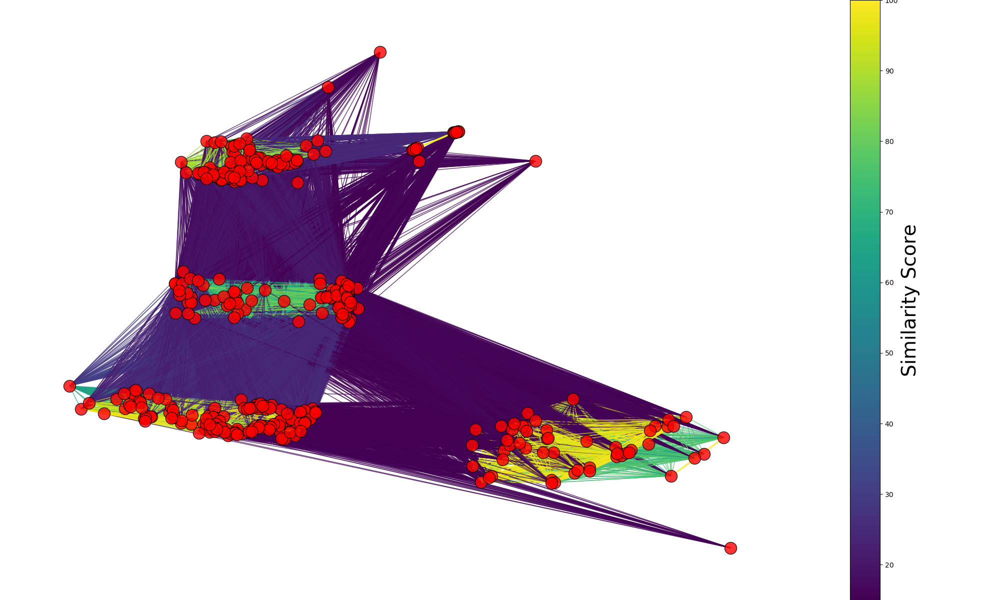

In [23]:
import networkx as nx
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

plt.close('all')

# sorted_muscle_df = sorted_muscle_df.apply(lambda x)
# Create a graph

# Draw the network
plt.figure(figsize=(20, 12))  # Adjust width and height as needed
G = nx.Graph()
# threshold = 15
# Add nodes to the graph

# # Define minimum and maximum threshold values
min_threshold = 15
max_threshold = 100

num_proteins = sorted_muscle_df.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        similarity_score = sorted_muscle_df.iloc[i, j]
        if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
#             print(i, j, similarity_score)
            G.add_edge(i, j, weight=similarity_score)
#         if similarity_score > threshold:  # Set your threshold here
#             G.add_edge(i, j, weight=similarity_score)
# # Draw the network
pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.viridis  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# # Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_color='red', node_size=300,
        edge_color=edge_weights, width=1, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap))
cbar.set_label('Similarity Score', fontsize=28)

# These nodes are by CDhit reference sequences
specific_nodes = {x-1: 'lightblue' for x in sorted([int(x.split('_')[1]) for x in muscle_df.index])}

# # Draw specific nodes with their specified colors
nx.draw_networkx_nodes(G, pos, nodelist=specific_nodes.keys(), node_color=list(specific_nodes.values()), node_size=300, edgecolors='black')


# Create custom legend handles
custom_legend = [Line2D([0], [0], color='red', linestyle='-', marker='o', markersize=20),
                 Line2D([0], [0], color='lightblue', linestyle='--', marker='o', markersize=20)]

# Create custom legend labels
legend_labels = ['sequences', 'CD-HIT cluster (≥ 90%)']
# Add legend with custom handles and labels

plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=20, ncol=2)
cbar.ax.tick_params(labelsize=20)
plt.title("Protein Similarity Network")
# plt.savefig(input_dir+'Network_graph.png', dpi=300)
plt.show()

In [25]:
from scipy.cluster import hierarchy


plt.close('all')

def calculate_distance_matrix(symm_matrix, custom_order):
    
    if custom_order == 'yes':
    # computer upper triu matrix without diagonal into a condensed 1-D array, input either sorted or unsorted symmetric matrix
    
    # Sort index and columns in ascending order
    # Reindex the DataFrame based on custom order
        custom_column_order = [f'sequence_{x}' for x in sorted([int(i.split('_')[1]) for i in symm_matrix.index])]

        symm_mat_sorted = symm_matrix.reindex(index=custom_column_order, columns=custom_column_order)
        symm_mat_sorted

        df = symm_mat_sorted.where(np.triu(np.ones(symm_mat_sorted.shape), k = 1).astype(bool))
        df = df.stack().reset_index()
        df.index = [x+'_'+y for x, y in zip(df['level_0'], df['level_1'])]
        df = df[[0]].rename(columns={0: 'values'})
        df = df.apply(lambda x: 1 - x*0.01)
        return df, custom_column_order
    
    elif custom_order=='no':
        
        symm_mat_sorted = symm_matrix
        df = symm_mat_sorted.where(np.triu(np.ones(symm_mat_sorted.shape), k = 1).astype(bool))
        df = df.stack().reset_index()
        df.index = [x+'_'+y for x, y in zip(df['level_0'], df['level_1'])]
        df = df[[0]].rename(columns={0: 'values'})
        df = df.apply(lambda x: 1 - x*0.01)
        return df

In [26]:
symm_dist = sorted_muscle_df
symm_dist

,sequence_1,sequence_2,sequence_3,sequence_4,sequence_5,sequence_6,sequence_7,sequence_8,sequence_9,sequence_10,...,sequence_402,sequence_403,sequence_404,sequence_405,sequence_406,sequence_407,sequence_408,sequence_409,sequence_410,sequence_411
sequence_1,100.00,13.25,24.83,13.10,25.52,88.24,84.31,12.86,84.31,24.83,...,10.00,11.33,25.52,83.66,12.41,13.16,11.18,84.31,25.00,83.66
sequence_2,13.25,100.00,17.93,10.26,20.00,12.58,13.16,10.27,13.16,20.00,...,82.87,84.72,19.31,13.25,10.06,12.77,23.04,13.16,20.14,13.16
sequence_3,24.83,17.93,100.00,15.17,66.44,26.21,23.97,15.11,23.97,65.07,...,17.93,17.93,66.44,22.76,14.48,15.75,14.48,23.97,68.28,24.66
sequence_4,13.10,10.26,15.17,100.00,16.55,14.48,15.75,95.42,15.07,15.86,...,11.61,9.03,16.55,15.17,95.71,91.41,9.26,15.75,14.58,15.75
sequence_5,25.52,20.00,66.44,16.55,100.00,26.21,24.66,15.83,24.66,73.29,...,19.31,20.00,98.63,22.76,15.86,17.12,15.17,24.66,82.07,25.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sequence_407,13.16,12.77,15.75,91.41,17.12,13.82,15.03,97.39,14.38,14.38,...,13.37,11.23,17.12,14.47,93.37,100.00,9.97,15.03,15.17,15.03
sequence_408,11.18,23.04,14.48,9.26,15.17,9.87,11.76,10.53,11.76,15.86,...,24.42,25.93,15.86,11.84,9.70,9.97,100.00,11.76,15.28,11.11
sequence_409,84.31,13.16,23.97,15.75,24.66,84.31,99.35,15.00,97.40,22.60,...,10.60,11.92,24.66,96.73,14.38,15.03,11.76,100.00,23.45,98.70
sequence_410,25.00,20.14,68.28,14.58,82.07,25.69,23.45,12.95,24.14,68.97,...,20.14,20.14,82.07,22.92,13.89,15.17,15.28,23.45,100.00,24.14


In [29]:
distance_mat, custom_order = calculate_distance_matrix(symm_dist, 'yes')
distance_mat

,values
sequence_1_sequence_2,0.8675
sequence_1_sequence_3,0.7517
sequence_1_sequence_4,0.8690
sequence_1_sequence_5,0.7448
sequence_1_sequence_6,0.1176
...,...
sequence_408_sequence_410,0.8472
sequence_408_sequence_411,0.8889
sequence_409_sequence_410,0.7655
sequence_409_sequence_411,0.0130


In [30]:
distance_mat_ref, custom_order_ref = calculate_distance_matrix(muscle_df_ref, 'yes')
distance_mat_ref

,values
sequence_3_sequence_10,0.3493
sequence_3_sequence_13,0.3425
sequence_3_sequence_15,0.3586
sequence_3_sequence_17,0.7329
sequence_3_sequence_20,0.7172
...,...
sequence_349_sequence_390,0.8500
sequence_349_sequence_407,0.8686
sequence_384_sequence_390,0.2877
sequence_384_sequence_407,0.8194


In [266]:
muscle_df_ref.loc['sequence_3']['sequence_10']

65.07

In [191]:
compute_dist['sequence_9_sequence_10']

0.774

In [1057]:
cmp = plt.cm.get_cmap('gist_rainbow', 5) 
# print(cmp)
if type(cmp) == matplotlib.colors.LinearSegmentedColormap:
    cmap = cmp(np.linspace(0, 1, 5))
    print(cmap)
else:
    cmap = cmp.colors
    print(cmap)

[[1.         0.         0.16       1.        ]
 [0.81081081 1.         0.         1.        ]
 [0.         1.         0.53763441 1.        ]
 [0.         0.10869565 1.         1.        ]
 [1.         0.         0.75       1.        ]]


## Radial tree

In [31]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np
# import matplotlib.cm as cm
from matplotlib.axes import Axes
import matplotlib
from matplotlib.lines import Line2D

# import seaborn as sns
# sns.set_theme()


colormap_list = [
    "nipy_spectral",
    "terrain",
    "gist_rainbow",
    "CMRmap",
    "coolwarm",
    "gnuplot",
    "gist_stern",
    "brg",
    "rainbow",
]


def radialTreee(
    Z2,
    fontsize=7,
    ax: Axes = None,
    pallete="gist_rainbow",
    addlabels=True,
    sample_classes=None,
    colorlabels=None,
    colorlabels_legend=None,
):

    """
    Drawing a radial dendrogram from a scipy dendrogram output.
    Parameters
    ----------
    Z2 : dictionary
        A dictionary returned by scipy.cluster.hierarchy.dendrogram
    addlabels: bool
        A bool to choose if labels are shown.
    fontsize : float
        A float to specify the font size

    ax : Axes or None:
        Axes in which to draw the plot, otherwise use the currently-active Axes.
    pallete : string

        Matlab colormap name.
    sample_classes : dict
        A dictionary that contains lists of sample subtypes or classes. These classes appear
        as color labels of each leaf. Colormaps are automatically assigned. Not compatible
        with options "colorlabels" and "colorlabels_legend".
        e.g., {"color1":["Class1","Class2","Class1","Class3", ....]}
    colorlabels : dict
        A dictionary to set color labels to leaves. The key is the name of the color label.
        The value is the list of RGB color codes, each corresponds to the color of a leaf.
        e.g., {"color1":[[1,0,0,1], ....]}
    colorlabels_legend : dict
        A nested dictionary to generate the legends of color labels. The key is the name of
        the color label. The value is a dictionary that has two keys "colors" and "labels".
        The value of "colors" is the list of RGB color codes, each corresponds to the class of a leaf.
        e.g., {"color1":{"colors":[[1,0,0,1], ....], "labels":["label1","label2",...]}}

    Returns
    -------
    Raises
    ------
    Notes
    -----
    References
    ----------
    See Also
    --------
    Examples
    --------
    """
    if ax is None:
        ax: Axes = plt.gca()
    linewidth = 1
    R = 1
    width = R * 0.1
    space = R * 0.05

    if colorlabels != None:
        offset = (
            width * len(colorlabels) / R + space * (len(colorlabels) - 1) / R + 0.05
        )
#         print(offset)
    elif sample_classes != None:
        offset = (
            width * len(sample_classes) / R
            + space * (len(sample_classes) - 1) / R
            + 0.05
        )
#         print(offset)
    else:

        offset = 0

    xmax = np.amax(Z2["icoord"])
    xmin = np.amin(Z2["icoord"])
    ymax = np.amax(Z2["dcoord"])
    # print(
    #     f"{xmax=}",
    #     np.amin(Z2["icoord"]),
    #     (xmax - xmin) / (len(Z2["ivl"]) - 1),
    #     (len(Z2["ivl"])),
    # )
    ucolors = sorted(set(Z2["color_list"]))
    # cmap = plt.cm.gist_rainbow(np.linspace(0, 1, len(ucolors)))
    cmp = plt.cm.get_cmap(pallete, len(ucolors))
    # print(cmp)
    if type(cmp) == matplotlib.colors.LinearSegmentedColormap:
        cmap = cmp(np.linspace(0, 1, len(ucolors)))
    else:
        cmap = cmp.colors

    nlabels = 0
    for icoord, dcoord, c in sorted(zip(Z2["icoord"], Z2["dcoord"], Z2["color_list"])):
        # x, y = Z2['icoord'][0], Z2['dcoord'][0]
        _color = cmap[ucolors.index(c)]
        if c == "C0":  # np.abs(_xr1)<0.000000001 and np.abs(_yr1) <0.000000001:
            _color = "black"

        # transforming original x coordinates into relative circumference positions and y into radius
        # the rightmost leaf is going to [1, 0]
        r = R * (1 - np.array(dcoord) / ymax)
        _x = np.cos(
            2 * np.pi * np.array([icoord[0], icoord[2]]) / xmax
        )  # transforming original x coordinates into x circumference positions
        _xr0 = _x[0] * r[0]
        _xr1 = _x[0] * r[1]
        _xr2 = _x[1] * r[2]
        _xr3 = _x[1] * r[3]
        _y = np.sin(
            2 * np.pi * np.array([icoord[0], icoord[2]]) / xmax
        )  # transforming original x coordinates into y circumference positions
        _yr0 = _y[0] * r[0]
        _yr1 = _y[0] * r[1]
        _yr2 = _y[1] * r[2]
        _yr3 = _y[1] * r[3]
        # ax.scatter([_xr0, _xr1, _xr2, _xr3],[_yr0, _yr1, _yr2,_yr3], c="b")

        # if y[0]>0 and y[3]>0:
        # _color="black"
        # plotting radial lines
        ax.plot([_xr0, _xr1], [_yr0, _yr1], c=_color, linewidth=linewidth)
        ax.plot([_xr2, _xr3], [_yr2, _yr3], c=_color, linewidth=linewidth)

        # plotting circular links between nodes
        if _yr1 > 0 and _yr2 > 0:
            link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _xr2, 100) ** 2)
            ax.plot(np.linspace(_xr1, _xr2, 100), link, c=_color, linewidth=linewidth)
        elif _yr1 < 0 and _yr2 < 0:
            link = -np.sqrt(r[1] ** 2 - np.linspace(_xr1, _xr2, 100) ** 2)

            ax.plot(np.linspace(_xr1, _xr2, 100), link, c=_color, linewidth=linewidth)
        elif _yr1 > 0 and _yr2 < 0:
            _r = r[1]
            if _xr1 < 0 or _xr2 < 0:
                _r = -_r
            link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _r, 100) ** 2)
            ax.plot(np.linspace(_xr1, _r, 100), link, c=_color, linewidth=linewidth)
            link = -np.sqrt(r[1] ** 2 - np.linspace(_r, _xr2, 100) ** 2)
            ax.plot(np.linspace(_r, _xr2, 100), link, c=_color, linewidth=linewidth)

    label_coords = []
    # determine the coordiante of the labels and their rotation:
    for i, label in enumerate(Z2["ivl"]):
        # scipy (1.x.x) places the leaves in x = 5+i*10 , and we can use this
        # to calulate where to put the labels
        place = (5.0 + i * 10.0) / xmax * 2
        label_coords.append(
            [
                np.cos(place * np.pi) * (1.05 + offset),  # _x
                np.sin(place * np.pi) * (1.05 + offset),  # _y
                place * 180,  # _rot
            ]
        )
    if addlabels == True:
        assert len(Z2["ivl"]) == len(label_coords), (
            f'Internal error, label numbers for Z2 ({len(Z2["ivl"])})'
            f" and for calculated labels ({len(label_coords)}) must be equal!"
        )
        for (_x, _y, _rot), label in zip(label_coords, Z2["ivl"]):
            ax.text(
                _x,
                _y,
                label,
                {"va": "center"},
                rotation_mode="anchor",
                rotation=_rot,
                fontsize=fontsize,
            )

    if colorlabels != None:
        assert len(Z2["ivl"]) == len(label_coords), (
            "Internal error, label numbers "
            + str(len(Z2["ivl"]))
            + " and "
            + str(len(label_coords))
            + " must be equal!"
        )

        j = 0
        outerrad = R * 1.05 + width * len(colorlabels) + space * (len(colorlabels) - 1)

#         print(outerrad)
        # sort_index=np.argsort(Z2['icoord'])
        # print(sort_index)
        intervals = []
        for i in range(len(label_coords)):
            _xl, _yl, _rotl = label_coords[i - 1]
            _x, _y, _rot = label_coords[i]
            if i == len(label_coords) - 1:
                _xr, _yr, _rotr = label_coords[0]
            else:
                _xr, _yr, _rotr = label_coords[i + 1]
            d = ((_xr - _xl) ** 2 + (_yr - _yl) ** 2) ** 0.5
            intervals.append(d)
        colorpos = intervals  # np.ones([len(label_coords)])
        labelnames = []
        for labelname, colorlist in colorlabels.items():

            colorlist = np.array(colorlist)[Z2["leaves"]]
            outerrad = outerrad - width * j - space * j
            innerrad = outerrad - width
            patches, texts = ax.pie(
                colorpos,
                colors=colorlist,
                radius=outerrad,
                counterclock=True,
                startangle=label_coords[0][2] * 0.5,
                wedgeprops=dict(
                    width=width,
                    # edgecolor='w', #if this is active the wedges will be more clearly separated
                ),
            )


            labelnames.append(labelname)
            j += 1

        if colorlabels_legend != None:
            for i, labelname in enumerate(labelnames):
#                 print(colorlabels_legend[labelname]["colors"])
                colorlines = []
                for c in colorlabels_legend[labelname]["colors"]:
                    colorlines.append(Line2D([0], [0], color=c, lw=4))

                leg = ax.legend(
                    colorlines,
                    colorlabels_legend[labelname]["labels"],
                    bbox_to_anchor=(1.5 + 0.3 * i, 1.0),
                    title=labelname,
                )
                ax.add_artist(leg)
    elif sample_classes != None:
        assert len(Z2["ivl"]) == len(label_coords), (
            "Internal error, label numbers "
            + str(len(Z2["ivl"]))
            + " and "
            + str(len(label_coords))
            + " must be equal!"
        )

        j = 0
        outerrad = (
            R * 1.05 + width * len(sample_classes) + space * (len(sample_classes) - 1)
        )

#         print(outerrad)
        # sort_index=np.argsort(Z2['icoord'])
        # print(sort_index)
        intervals = []
        for i in range(len(label_coords)):
            _xl, _yl, _rotl = label_coords[i - 1]
            _x, _y, _rot = label_coords[i]
            if i == len(label_coords) - 1:
                _xr, _yr, _rotr = label_coords[0]
            else:
                _xr, _yr, _rotr = label_coords[i + 1]
            d = ((_xr - _xl) ** 2 + (_yr - _yl) ** 2) ** 0.5
            intervals.append(d)
        colorpos = intervals  # np.ones([len(label_coords)])
        labelnames = []
        colorlabels_legend = {}
        for labelname, colorlist in sample_classes.items():

            ucolors = sorted(list(np.unique(colorlist)))
            type_num = len(ucolors)
            _cmp = plt.cm.get_cmap(colormap_list[j], type_num)
            _colorlist = [_cmp(ucolors.index(c)) for c in colorlist]
            _colorlist = np.array(_colorlist)[Z2["leaves"]]
            outerrad = outerrad - width * j - space * j
            innerrad = outerrad - width
            patches, texts = ax.pie(
                colorpos,
                colors=_colorlist,
                radius=outerrad,
                counterclock=True,
                startangle=label_coords[0][2] * 0.5,
                wedgeprops=dict(
                    width=width,
                    # edgecolor='w', #if this is active the wedges will be more clearly separated
                ),
            )


            labelnames.append(labelname)
            colorlabels_legend[labelname] = {}
            colorlabels_legend[labelname]["colors"] = _cmp(np.linspace(0, 1, type_num))
            colorlabels_legend[labelname]["labels"] = ucolors
            j += 1

        if colorlabels_legend != None:
            for i, labelname in enumerate(labelnames):
#                 print(colorlabels_legend[labelname]["colors"])
                colorlines = []
                for c in colorlabels_legend[labelname]["colors"]:
                    colorlines.append(Line2D([0], [0], color=c, lw=4))
                leg = ax.legend(
                    colorlines,
                    colorlabels_legend[labelname]["labels"],
                    bbox_to_anchor=(1.5 + 0.3 * i, 1.0),
                    title=labelname,
                )
                ax.add_artist(leg)
            # break
#     print('ERROR IS HERE')
    ax.set_frame_on(False)
    
#     ax.spines.right.set_visible(False)
#     ax.spines.top.set_visible(False)
#     ax.spines.left.set_visible(False)
#     ax.spines.bottom.set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    if colorlabels != None:
        maxr = R * 1.05 + width * len(colorlabels) + space * (len(colorlabels) - 1)
    elif sample_classes != None:
        maxr = (
            R * 1.05 + width * len(sample_classes) + space * (len(sample_classes) - 1)
        )
    else:
        maxr = R * 1.05
    ax.set_xlim(-maxr, maxr)
    ax.set_ylim(-maxr, maxr)
    return ax


def plot(
    Z2,
    fontsize=6,
    figsize=None,
    pallete="gist_rainbow",
    addlabels=True,
    show=True,
    sample_classes=None,
    colorlabels=None,
    colorlabels_legend=None,
):
    """
    Drawing a radial dendrogram from a scipy dendrogram output.
    Parameters
    ----------
    Z2 : dictionary
        A dictionary returned by scipy.cluster.hierarchy.dendrogram
    addlabels: bool
        A bool to choose if labels are shown.
    fontsize : float
        A float to specify the font size
    figsize : [x, y] array-like
        1D array-like of floats to specify the figure size
    pallete : string
        Matlab colormap name.
    sample_classes : dict
        A dictionary that contains lists of sample subtypes or classes. These classes appear
        as color labels of each leaf. Colormaps are automatically assigned. Not compatible
        with options "colorlabels" and "colorlabels_legend".
        e.g., {"color1":["Class1","Class2","Class1","Class3", ....]}
    colorlabels : dict
        A dictionary to set color labels to leaves. The key is the name of the color label.
        The value is the list of RGB color codes, each corresponds to the color of a leaf.
        e.g., {"color1":[[1,0,0,1], ....]}
    colorlabels_legend : dict
        A nested dictionary to generate the legends of color labels. The key is the name of
        the color label. The value is a dictionary that has two keys "colors" and "labels".
        The value of "colors" is the list of RGB color codes, each corresponds to the class of a leaf.
        e.g., {"color1":{"colors":[[1,0,0,1], ....], "labels":["label1","label2",...]}}

    Returns
    -------
    Raises
    ------
    Notes
    -----
    References
    ----------
    See Also
    --------
    Examples
    --------
    """

    plt.rcParams["font.family"] = "sans-serif"
    plt.rcParams["font.sans-serif"] = ["Arial"]
    plt.rcParams["svg.fonttype"] = "none"

    if figsize == None and colorlabels != None:
        figsize = [10, 5]
    elif figsize == None and sample_classes != None:
        figsize = [10, 5]
    elif figsize == None:
        figsize = [5, 5]
    fig, ax = plt.subplots(figsize=figsize)
    ax = radialTreee(
        Z2,
        fontsize=fontsize,
        ax=ax,
        pallete=pallete,
        addlabels=addlabels,
        sample_classes=sample_classes,
        colorlabels=colorlabels,
        colorlabels_legend=colorlabels_legend,
    )

    if show == True:
        plt.show()
    else:
        return ax


def mat_plot(mat):
    # Take a matrix data instead of a dendrogram data, calculate dendrogram and draw a circular dendrogram
    pass


def pandas_plot(df):

    pass


def _test_1(Z2):
    # optionally leaves can be labeled by colors
    type_num = 12
    _cmp = plt.cm.get_cmap("bwr", type_num)
    _cmp2 = plt.cm.get_cmap("hot", type_num)
    colors_dict = {
        "example_color": _cmp(np.random.rand(numleaf)),
        "example_color2": _cmp2(np.random.rand(numleaf)),
    }
    colors_legends = {
        "example_color": {
            "colors": _cmp(np.linspace(0, 1, type_num)),
            "labels": ["ex1_" + str(i + 1) for i in range(type_num)],
        },
        "example_color2": {
            "colors": _cmp2(np.linspace(0, 1, type_num)),
            "labels": ["ex2_" + str(i + 1) for i in range(type_num)],
        },
    }
    # fig = pylab.figure(figsize=(8,8))

    # Compute and plot the dendrogram.
    # ax2 = fig.add_axes([0.3,0.71,0.6,0.2])

    fig, ax = plt.subplots(figsize=(10, 5))
    # plot(Z2, colorlabels=colors_dict,colorlabels_legend=colors_legends,show=True)
    radialTreee(Z2, ax=ax, colorlabels=colors_dict, colorlabels_legend=colors_legends)
    plt.show()


def _test_2(Z2):
    type_num = 6
    type_list = ["ex" + str(i) for i in range(type_num)]
    sample_classes = {
        "example_color": [np.random.choice(type_list) for i in range(numleaf)]
    }
    fig, ax = plt.subplots(figsize=(10, 5))
    radialTreee(Z2, ax=ax, sample_classes=sample_classes)
    plt.show()
    # plot(Z2, sample_classes=sample_classes,show=True)


def _test_3(Z2):
    fig, ax = plt.subplots(2, 2, figsize=(10, 10))
    ax = ax.flatten()
    # no arguments
    radialTreee(Z2, ax=ax[0])
    ax[0].set_aspect(1)

    type_num = 12
    _cmp = plt.cm.get_cmap("bwr", type_num)
    _cmp2 = plt.cm.get_cmap("hot", type_num)
    colors_dict = {
        "example_color": _cmp(np.random.rand(numleaf)),
        "example_color2": _cmp2(np.random.rand(numleaf)),
    }
    colors_legends = {
        "example_color": {
            "colors": _cmp(np.linspace(0, 1, type_num)),
            "labels": ["ex1_" + str(i + 1) for i in range(type_num)],
        },
        "example_color2": {
            "colors": _cmp2(np.linspace(0, 1, type_num)),
            "labels": ["ex2_" + str(i + 1) for i in range(type_num)],
        },
    }
    # fig = pylab.figure(figsize=(8,8))

    # Compute and plot the dendrogram.
    # ax2 = fig.add_axes([0.3,0.71,0.6,0.2])

    # like in test_1
    radialTreee(
        Z2, ax=ax[1], colorlabels=colors_dict, colorlabels_legend=colors_legends
    )

    type_num = 6
    type_list = ["ex" + str(i) for i in range(type_num)]
    sample_classes = {
        "example_color": [np.random.choice(type_list) for i in range(numleaf)]
    }
    radialTreee(Z2, ax=ax[2], sample_classes=sample_classes)
    ax[3].axis("off")
    plt.show()



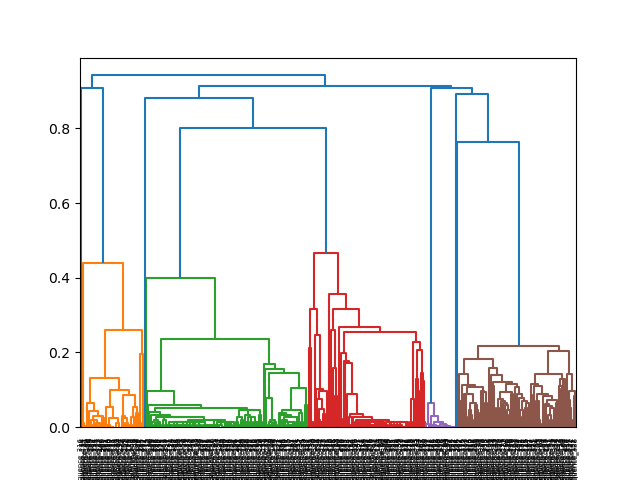

In [270]:

plt.close('all')

# Compute linkage using the condensed distance matrix
Y = hierarchy.linkage(distance_mat['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y)

Z2 = sch.dendrogram(Y, labels=custom_order, no_plot=False)

In [32]:
# reference_df

In [33]:
cd_dict = {}
# based on CD-hit clustering, create a dict with {cluster id : [seq1, seq2, ...,seqN], cluster X: []}

num = 0 # this number tells about how many sequences are updated in dict
for i in reference_df.index:
#     print(reference_df.iloc[i][['cluster_id', 'sequence_id']])
#     print(i)
    
    cid = reference_df.iloc[i]['cluster_id']
#     print(cid)
    if cid in list(clusters_dict.keys()):
#         print(cid)
        cd_dict.update({format(reference_df.iloc[i]['cluster_id']): ['sequence_'+format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]})
#         cd_dict.update({'sequence_'+format(reference_df.iloc[i]['sequence_id']): ['sequence_'+format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]})
#         print(len([f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]))
        num += len(['sequence_'+format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']])
    elif not cid in list(clusters_dict.keys()):
#         print(cid)
#         print(reference_df.iloc[i]['sequence_id'])
        cd_dict.update({format(reference_df.iloc[i]['cluster_id']): [f'sequence_'+str(reference_df.iloc[i]['sequence_id'])]})
#         cd_dict.update({'sequence_'+format(reference_df.iloc[i]['sequence_id']): [f'sequence_'+str(reference_df.iloc[i]['sequence_id'])]})
#         print(len([f'sequence_'+str(reference_df.iloc[i]['sequence_id'])]))
        num +=len([f'sequence_'+str(reference_df.iloc[i]['sequence_id'])])
    else:
        print(i)
# print(num)
cluster_mapping = sorted([y+'-'+x for x, a in cd_dict.items() for y in a])
print(len(cluster_mapping))
print(cluster_mapping[:10])

411
['sequence_1-Cluster 2', 'sequence_10-Cluster 19', 'sequence_100-Cluster 1', 'sequence_101-Cluster 0', 'sequence_102-Cluster 5', 'sequence_103-Cluster 1', 'sequence_104-Cluster 4', 'sequence_105-Cluster 4', 'sequence_106-Cluster 2', 'sequence_107-Cluster 4']


In [41]:
type_num = len(cd_dict.keys())  # total number of clusters by CD-HIT
print(type_num)

cluster_mapping_ordered = {}
cluster_mapping_ordered_seq = {}
for x in sorted_muscle_df.index:
    
    for a in cluster_mapping:
#         print(a)
        a1 = a.split('-')[0]
        a2 = a.split('-')[1]
#         print(a1, a2)
        if a1 == x:
            cluster_mapping_ordered.update({a1: a2})

orphan = [i for i in cd_dict.keys() if len(cd_dict[i]) < 2]   # orphan-sequences (which weren't assigned to any clusters)
type_num = type_num - len(orphan)
print(type_num) # so total unique clusters come out to be 23 without orphan sequences

type_list = {j: j for i, j in zip(range(1, type_num+1), [x for x in cd_dict.keys() if not x in orphan])} 
type_list.update({j: "cluster X" for j in orphan})  # assign cluster X for orphan
print(type_list)

colors_mapping = [type_list[i] for i in cluster_mapping_ordered.values()]
# print(colors_mapping)

sample_classes = {
    "cluster (≥ 90%)": colors_mapping
    
}

45
23
{'Cluster 0': 'Cluster 0', 'Cluster 1': 'Cluster 1', 'Cluster 2': 'Cluster 2', 'Cluster 3': 'Cluster 3', 'Cluster 4': 'Cluster 4', 'Cluster 5': 'Cluster 5', 'Cluster 6': 'Cluster 6', 'Cluster 7': 'Cluster 7', 'Cluster 8': 'Cluster 8', 'Cluster 9': 'Cluster 9', 'Cluster 10': 'Cluster 10', 'Cluster 11': 'Cluster 11', 'Cluster 12': 'Cluster 12', 'Cluster 13': 'Cluster 13', 'Cluster 14': 'Cluster 14', 'Cluster 15': 'Cluster 15', 'Cluster 16': 'Cluster 16', 'Cluster 17': 'Cluster 17', 'Cluster 18': 'Cluster 18', 'Cluster 19': 'Cluster 19', 'Cluster 20': 'Cluster 20', 'Cluster 21': 'Cluster 21', 'Cluster 22': 'Cluster 22', 'Cluster 23': 'cluster X', 'Cluster 24': 'cluster X', 'Cluster 25': 'cluster X', 'Cluster 26': 'cluster X', 'Cluster 27': 'cluster X', 'Cluster 28': 'cluster X', 'Cluster 29': 'cluster X', 'Cluster 30': 'cluster X', 'Cluster 31': 'cluster X', 'Cluster 32': 'cluster X', 'Cluster 33': 'cluster X', 'Cluster 34': 'cluster X', 'Cluster 35': 'cluster X', 'Cluster 36': 'clu

In [40]:
orphan

['Cluster 23',
 'Cluster 24',
 'Cluster 25',
 'Cluster 26',
 'Cluster 27',
 'Cluster 28',
 'Cluster 29',
 'Cluster 30',
 'Cluster 31',
 'Cluster 32',
 'Cluster 33',
 'Cluster 34',
 'Cluster 35',
 'Cluster 36',
 'Cluster 37',
 'Cluster 38',
 'Cluster 39',
 'Cluster 40',
 'Cluster 41',
 'Cluster 42',
 'Cluster 43',
 'Cluster 44']

In [37]:
len(colors_mapping)

411

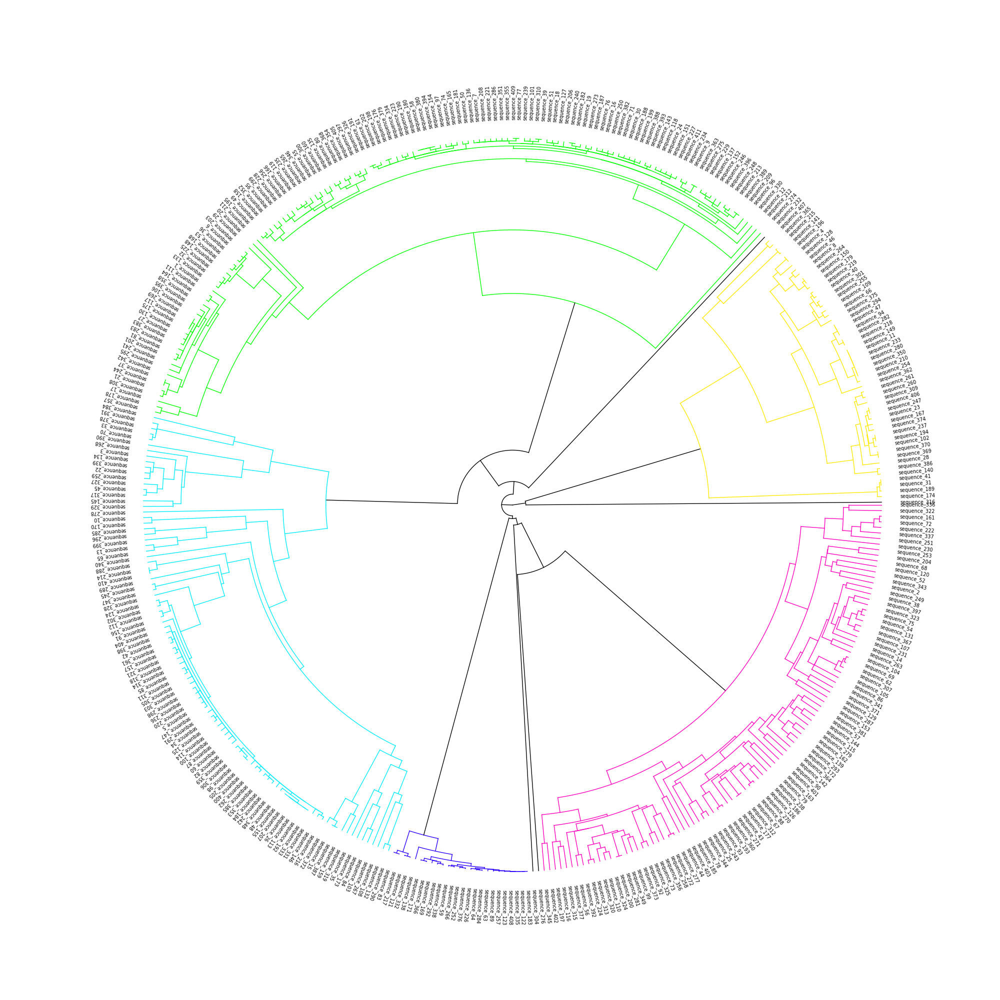

In [1038]:
plt.close()
Z2 = sch.dendrogram(Y, labels=custom_order, no_plot=True)

sch_big_dd = {'C0': 'black', 'C1': 'yellow', 'C2': 'green','C3': 'skyblue','C4': 'blue', 'C5': 'pink'}
big_dendrogram_df = pd.DataFrame([Z2['leaves_color_list'], # leaves colorcode list
              Z2['ivl'],               # leaves original name
             [sch_big_dd[x] for x in Z2['leaves_color_list']],   # leaves colornames (matplotlib tab10)
             [x.split('_')[1] for x in Z2['ivl']],  # query sequence id
             ]).T

print(sch_big_dd)

fig, ax = plt.subplots(figsize=(20, 20))

radialTreee(Z2, ax=ax)

# Create custom legend handles
custom_legend = [Line2D([0], [0], color='red', linestyle='-', marker='o', markersize=20),
                 Line2D([0], [0], color='lightblue', linestyle='--', marker='o', markersize=20)]

# # Create custom legend labels
legend_labels = ['sequences', 'CD-HIT cluster (≥ 90%)']
# # Add legend with custom handles and labels

# plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=20, ncol=2)
# plt.savefig(input_dir+'radialtree.png', dpi=300, bbox_inches='tight')
plt.show()

In [1045]:
# big_dendrogram_df[]

{'C0': 'black',
 'C1': 'yellow',
 'C2': 'green',
 'C3': 'skyblue',
 'C4': 'blue',
 'C5': 'pink'}

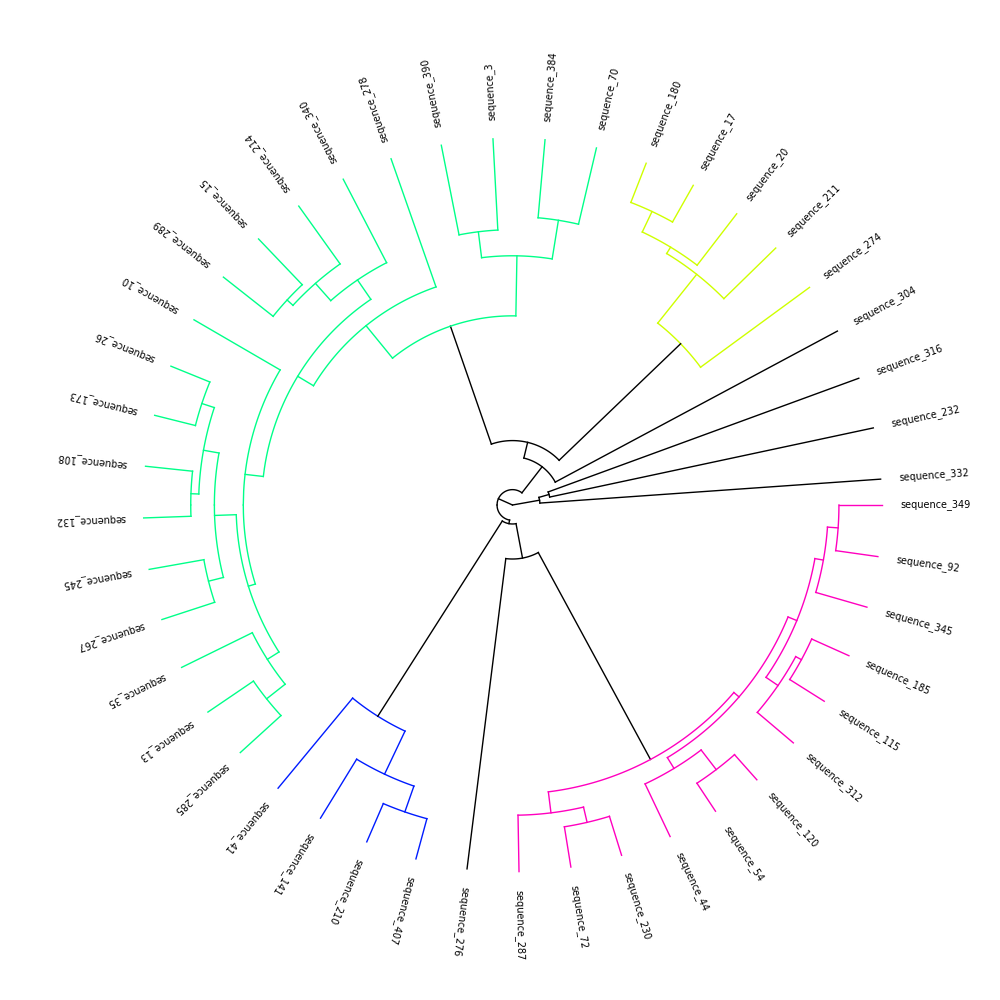

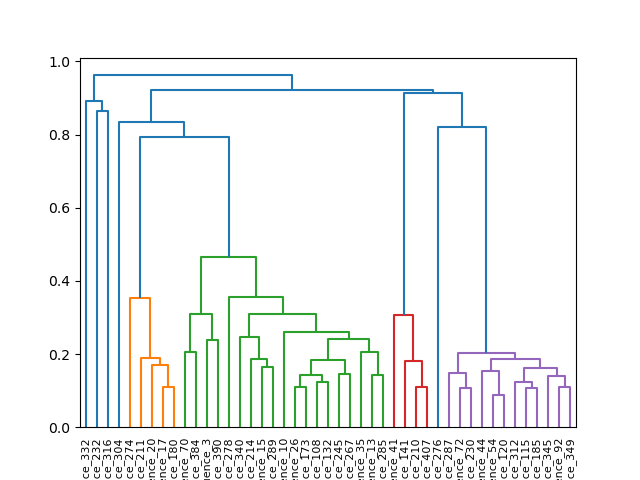

In [275]:
plt.close()
Y_ref = hierarchy.linkage(distance_mat_ref['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref)

Z2_ref = sch.dendrogram(Y_ref, labels=custom_order_ref, no_plot=False)
fig, ax = plt.subplots(figsize=(10, 10))
radialTreee(Z2_ref, ax=ax)

plt.show()

In [285]:
muscle_df_ref.loc['sequence_316']['sequence_232']

13.7

In [54]:
# reference_df

In [411]:
# for x in cd_dict['Cluster 1']:
# #     print(x)
#     ref_id = 'sequence_'+str(reference_df[reference_df['cluster_id'] == 'Cluster 1']['sequence_id'].values[0])
    
#     print(ref_id, x, sorted_muscle_df[ref_id].loc[x])
    
    # print ref and cluster sequences
#     ref_seq = reference_df[reference_df['cluster_id'] == 'Cluster 1']['sequence'].values[0]
#     colorprint(ref_seq, 'red')
    
#     if not len(clusters_dict['Cluster 1'][clusters_dict['Cluster 1']['seq_id'] == x]['sequence']) == 0:
#         colorprint(clusters_dict['Cluster 1'][clusters_dict['Cluster 1']['seq_id'] == x]['sequence'].values[0], 'blue')
#         print()

In [71]:
# reference_df

In [238]:
plt.close()
# If y is a 1-D condensed distance matrix, then y must be a 
#  sized vector, where n is the number of original observations paired in the distance matrix.

# A (n-1) by 4 matrix Z is returned. (410 * 4) here
# At the ith iteration, clusters with indices Z[i, 0] and Z[i, 1] are combined to form cluster 
# A cluster with an index less than corresponds to one of the original observations. 
# The distance between clusters Z[i, 0] and Z[i, 1] is given by Z[i, 2]. 
# The fourth value Z[i, 3] represents the number of original observations in the newly formed cluster.

Z = hierarchy.linkage(distance_mat, method='average')  # You can use different linkage methods
# print(Z, Z[0, 0], Z[0, 1])
# # # Plot the dendrogram
# plt.figure(figsize=(10, 5))
# dn = hierarchy.dendrogram(Z)

# plt.title('Dendrogram')
# plt.xlabel('Data Points')
# plt.ylabel('Distance')
# plt.show()

In [89]:
plt.close('all')
# sns.clustermap(muscle_df_all, vmin=20, vmax=100)
# plt.xticks(fontsize=8)
# plt.yticks(fontsize=8)
# plt.show()

In [73]:
blast_path = input_dir+'BLAST_output\\proteins_45\\'

In [324]:
main_blast_job = pd.read_json(blast_path+'0GA5FXSX01N.json')
blast_ids_list = [x['File'] for x in main_blast_job['BlastJSON']]
# blast_ids_list

In [389]:
# # HSPs (high-scoring segment pairs)
# ‘bit score’: score (in bits) of HSP (float);
# ‘evalue’: e-value of HSP (float);
# ‘identity’: number of identities in HSP (integer);
# ‘positive’: number of positives in HSP (integer);
# ‘gaps’: number of gaps in HSP (integer);
# ‘midline’: formating middle line.

for i in blast_ids_list:
    try:
        with open(blast_path+i) as f:
            data = json.load(f)
            hits_dict = data['BlastOutput2']['report']['results']['search']['hits']                    # data about hits
            query_title = data['BlastOutput2']['report']['results']['search']['query_title']           # original fasta id from query: query title
            query_len = data['BlastOutput2']['report']['results']['search']['query_len']               # original length of sequence from query
#             print(query_title)
    #         print(hits_dict)
            params = []
            for x in hits_dict:
    #             params.append()
    #             print(x['num'])
                description = pd.Series(x['description'][0])
                description['num'] = x['num']
                description['len'] = x['len']
    #             print(description)
                hsps = pd.Series(x['hsps'][0])
    #             print(hsps)
                combined = pd.concat([description, hsps])
    #             print(combined)
                params.append(combined)
    #         print(len(params))
    #         print(params[0])
            params_df = pd.concat(params, axis=1).T
            params_df['query_title'] = [query_title for z in range(len(params_df.index))]
            params_df['query_len'] = [query_len for z in range(len(params_df.index))]
#             print(params_df['query_title'])
            params_df.to_csv(blast_path+i.split('.')[0]+'.csv')
    except:
        print(i, 'DOESNT EXIST')
        pass

0GA5FXSX01N_38.json DOESNT EXIST


#### The BLAST E-value is the number of expected hits of similar quality (score) that could be found just by chance.

#### E-value of 10 means that up to 10 hits can be expected to be found just by chance, given the same size of a random database.

#### E-value can be used as a first quality filter for the BLAST search result, to obtain only results equal to or better than the number given by the -evalue  option. Blast results are sorted by E-value by default (best hit in first line).

#### small E-value: low number of hits, but of high quality. Blast hits with an E-value smaller than 1e-50  includes database matches of very high quality.
#### last hits with E-value smaller than 0.01 can still be considered as good hit for homology matches.
#### large E-value: many hits, partly of low quality. E-value smaller than 10 will include hits that cannot be considered as significant, but may give an idea of potential relations.

####   E = m x n  / 2bit-score, where m = query sequence length, n = total database length (sum of all sequences)



In [390]:

top_hits = []

for item in os.listdir(blast_path):
    if item.endswith('.csv'):
#         print(item)
        blast_info = pd.read_csv(blast_path+item.split('.')[0]+'.csv', index_col=0)
        top_hits.append(blast_info.iloc[0])
#         print(blast_info.iloc[0] )
#         print()
#     break

In [391]:
# HSPs (high-scoring segment pairs)

colorprint(blast_info.iloc[0]['qseq'], 'red')
colorprint(blast_info.iloc[0]['hseq'], 'blue')
# colorprint(blast_info.iloc[0]['midline'], 'green')

FLDGIEKAQEEHEKYHNNWRAMAEDFQIPQVVAKEIVAQCPKCQVKGEAMHGQVDASPKTWQMDCTHLEGKVIIVAVHVASGYIEAEVLPAETGKETAHFLLKLAARWPVKHLHTDNGDNFTSSAVQAVCWWAQIEHTFGVPYNPQSQGVVESMNHQLKTIITQIRDQAEKIETAVQMAVLIHNFKRKGGIGGYSAGERIIDIIASDLQTTKLQNQISKIQNFRVYFREGRDQQWKGPATLIWKGEGAVVIQDGQDLKVVPRRKCKIIKDYGRKDVDSETSMEGRQEKD
FLDGIDKAQEEHEKYHNNWRAMASDFNLPPVVAKEIVANCDKCQLKGEAMHGQVDCSPGIWQLDCTHLEGKIILVAVHVASGYIEAEVIPAETGQETAYFILKLAGRWPVKIIHTDNGSNFTSTVVKAACWWAGIQQEFGVPYNPQSQGVVESMNKELKKIIGQIRDQAEHLKTAVQMAVFIHNFKRKGGIGGYSAGERIIDIIATDIQTKELQKQITKIQNFRVYFRDSRDPVWKGPAKLLWKGEGAVVIQDNNEIKVVPRRKAKIIRDYG-KQMAGDDCVAGRQDED


In [392]:
top_hits_df = pd.concat(top_hits, axis=1).T
top_hits_df.index = range(1, len(top_hits)+1)
top_hits_df
# top_hits_df[top_hits_df['evalue'] != 0]

,id,accession,title,taxid,sciname,num,len,num.1,bit_score,score,...,query_to,hit_from,hit_to,align_len,gaps,qseq,hseq,midline,query_title,query_len
1,sp|P02123.1|,P02123,RecName: Full=Hemoglobin subunit beta; AltName...,8801,Struthio camelus,1,146,1,291.582,745,...,146,1,146,146,0,VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFG...,VQWSAEEKQLISGLWGKVNVADCGAEALARLLIVYPWTQRFFASFG...,VQWSAEEKQLIS LWGKVNVA+CGAEALARLLIVYPWTQRFF SFG...,sequence_3,146
2,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,359.377,921,...,216,1,216,217,2,QSVLTQPPSASGTPGQRVTISCSGSSSNIG-ENSVTWYQHLSGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPSASG+ GQ VTISC+G+SS++G N V+WYQ +G AP...,sequence_44,216
3,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.132,897,...,217,1,216,217,1,QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS SG+ GQ VTISCTG+SS++G V WYQQ G AP...,sequence_54,220
4,sp|P61921.2|,P61921,RecName: Full=Hemoglobin subunit gamma-2; AltN...,9598,Pan troglodytes,1,147,1,301.212,770,...,147,2,147,146,0,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,sequence_70,147
5,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,406.371,1043,...,217,1,216,217,1,QSALTQPPSGSGSPGQSVTISCTGTSSDVGGYKYVSWYQQHPGKAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QSALTQPPS SGS GQSVTISCTGTSSDVGGY YVSWYQQH GKAP...,sequence_72,217
6,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.903,899,...,216,1,216,217,2,QSVLTQPPSVSAAPGQKVTISCSGNNSNIG-KNYVSWYQQLPGRTP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS S + GQ VTISC+G +S++G NYVSWYQQ G+ P...,sequence_92,216
7,sp|P68011.1|,P68011,RecName: Full=Hemoglobin subunit beta; AltName...,29073,Ursus maritimus,1,146,1,280.026,715,...,146,1,146,146,0,VHLTAEEKAHVSGLWGKVNTEEVGGEALGRLLVVYPWTQRFFETFG...,VHLTGEEKSLVTGLWGKVNVDEVGGEALGRLLVVYPWTQRFFDSFG...,VHLT EEK+ V+GLWGKVN +EVGGEALGRLLVVYPWTQRFF++FG...,sequence_108,146
8,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.517,898,...,243,1,216,219,4,QSVLTQPPSASGTPGQRVTISCSGSSSNIGT-NTVNWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPSASG+ GQ VTISC+G+SS++G N V+WYQQ G AP...,sequence_115,243
9,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,354.369,908,...,245,1,216,218,3,QSVLTQPPSVSGAPGQRVTISCSGSRSNIGS-NTVKWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS SG+ GQ VTISC+G+ S++G N V WYQQ G AP...,sequence_120,245
10,sp|P60524.1|,P60524,RecName: Full=Hemoglobin subunit beta; AltName...,9615,Canis lupus familiaris,1,146,1,295.434,755,...,146,1,146,146,0,VHLTAEEKSLVSGLWAKVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,VHLTAEEKSLVSGLWGKVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,VHLTAEEKSLVSGLW KVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,sequence_132,146


In [532]:
# since there are 45 ids total: but one of them has no hits, so I add 'No hits term'
uniprot_ref_mapping = {y: f'{y}: {x}' for x, y in zip(top_hits_df['accession'], top_hits_df['query_title'])}
print(uniprot_ref_mapping)

# add the extra sequence_id for which no hits found
for x in ['sequence_'+str(o) for o in reference_df['sequence_id']]:
    if not x in uniprot_ref_mapping.keys():
        print(x)
        uniprot_ref_mapping.update({x: f'{x}: No hits'})

{'sequence_3': 'sequence_3: P02123', 'sequence_44': 'sequence_44: P0DOX8', 'sequence_54': 'sequence_54: P0DOX8', 'sequence_70': 'sequence_70: P61921', 'sequence_72': 'sequence_72: P0DOX8', 'sequence_92': 'sequence_92: P0DOX8', 'sequence_108': 'sequence_108: P68011', 'sequence_115': 'sequence_115: P0DOX8', 'sequence_120': 'sequence_120: P0DOX8', 'sequence_132': 'sequence_132: P60524', 'sequence_141': 'sequence_141: P12497', 'sequence_10': 'sequence_10: P02095', 'sequence_173': 'sequence_173: D0VX08', 'sequence_180': 'sequence_180: P02185', 'sequence_185': 'sequence_185: P0DOX8', 'sequence_210': 'sequence_210: P12497', 'sequence_211': 'sequence_211: P02186', 'sequence_214': 'sequence_214: P02062', 'sequence_230': 'sequence_230: P0DOX8', 'sequence_232': 'sequence_232: P08083', 'sequence_245': 'sequence_245: P02067', 'sequence_267': 'sequence_267: P07412', 'sequence_13': 'sequence_13: P02088', 'sequence_274': 'sequence_274: P56208', 'sequence_276': 'sequence_276: P70207', 'sequence_278': '

In [533]:
len(uniprot_ref_mapping)

45

In [534]:
muscle_df_ref_uniprot = muscle_df_ref.copy()
muscle_df_ref_uniprot.rename(index= uniprot_ref_mapping, columns=uniprot_ref_mapping, inplace=True)
# muscle_df_ref_uniprot
distance_mat_ref_uniprot = calculate_distance_matrix(muscle_df_ref_uniprot, custom_order='no')
distance_mat_ref_uniprot


,values
sequence_316: No hits_sequence_41: Q9QBZ5,0.8993
sequence_316: No hits_sequence_407: P12497,0.8921
sequence_316: No hits_sequence_141: P12497,0.8921
sequence_316: No hits_sequence_210: P12497,0.8716
sequence_316: No hits_sequence_232: P08083,0.8630
...,...
sequence_115: P0DOX8_sequence_287: P0DOX8,0.1830
sequence_115: P0DOX8_sequence_54: P0DOX8,0.0926
sequence_120: P0DOX8_sequence_287: P0DOX8,0.1745
sequence_120: P0DOX8_sequence_54: P0DOX8,0.0880


In [644]:
# print(muscle_df_ref.loc['sequence_211'][['sequence_20', 'sequence_17', 'sequence_180', 'sequence_274']])
# top_hits_df[top_hits_df['query_title'].isin(['sequence_211', 'sequence_20', 'sequence_17', 'sequence_180', 'sequence_274'])]


In [648]:
colorprint(reference_df[reference_df['sequence_id'] == 54]['sequence'].values[0], 'red')
colorprint(reference_df[reference_df['sequence_id'] == 120]['sequence'].values[0], 'blue')
aln= pairwise2.align.localxx(reference_df[reference_df['sequence_id'] == 54]['sequence'].values[0], reference_df[reference_df['sequence_id'] == 120]['sequence'].values[0])
print('ALIGNMENT')
colorprint(aln[0].seqA, 'red')
colorprint(aln[0].seqB, 'blue')

QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAPKLLISGNSNRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDSSLSGSVFGGGTKLTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECSARQ
MGILPSPGMPALLSLVSLLSVLLMGCVAQSVLTQPPSVSGAPGQRVTISCSGSRSNIGSNTVKWYQQLPGTAPKLLIYYNDQRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDRYTHPALLFGTGTKVTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECS
ALIGNMENT
----------------------------QSVLTQPPSVSGAPGQRVTISCTGS-S-SNIGAGYA---VH-WYQQLPGTAPKLLISGNS--N--RPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDSS------LSGSV-FGG-GTKL-TVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECSARQ
MGILPSPGMPALLSLVSLLSVLLMGCVAQSVLTQPPSVSGAPGQRVTISC--SGSRSNI--G--SNTV-KWYQQLPGTAPKLLI----YYNDQRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYD--RYTHPAL----LF-GTGTK-VTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVE

<ipython-input-232-1b0cab690ea8>:167: RuntimeWarning: invalid value encountered in sqrt
  link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _r, 100) ** 2)
<ipython-input-232-1b0cab690ea8>:169: RuntimeWarning: invalid value encountered in sqrt
  link = -np.sqrt(r[1] ** 2 - np.linspace(_r, _xr2, 100) ** 2)


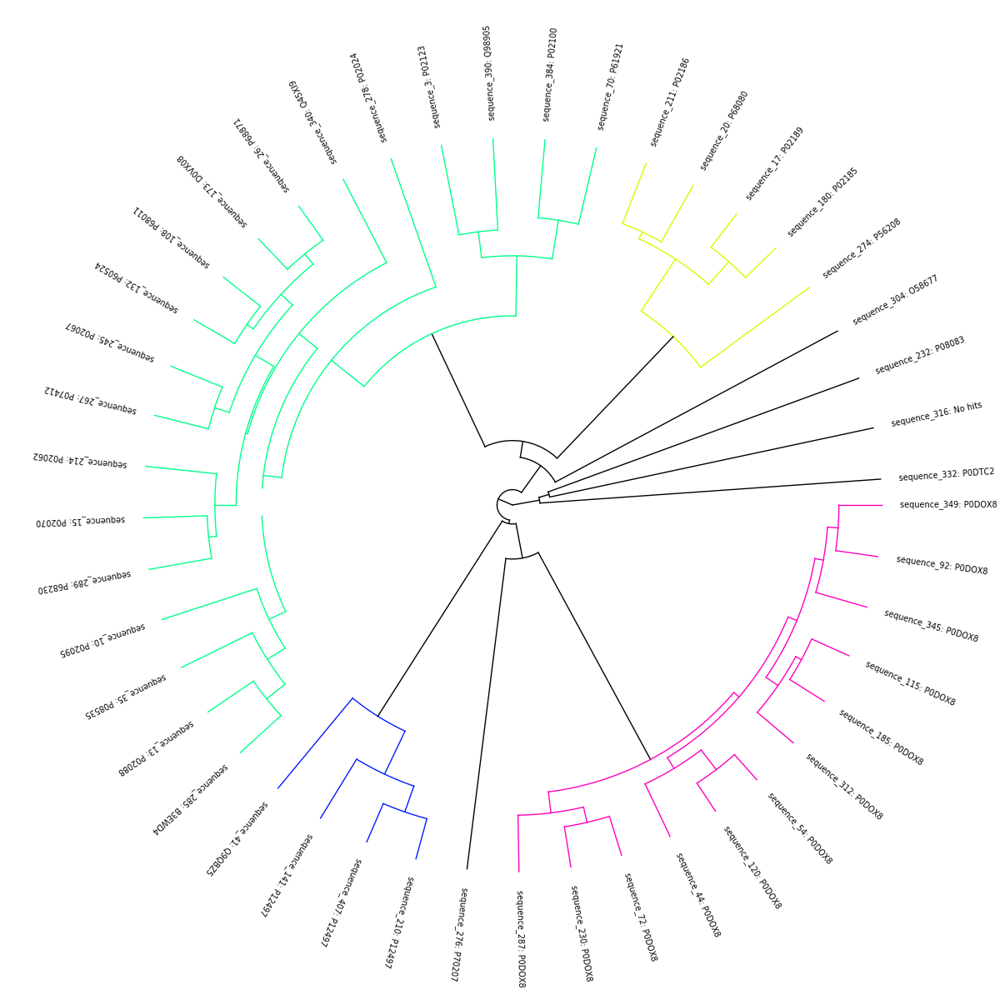

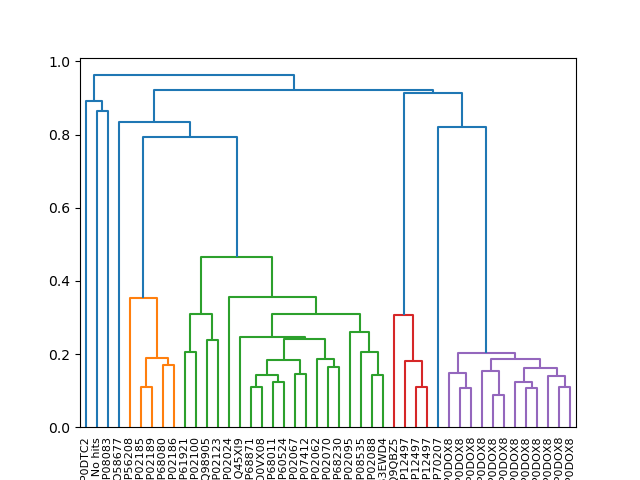

In [536]:

plt.close('all')
Y_ref_uniprot = hierarchy.linkage(distance_mat_ref_uniprot['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref_uniprot)

Z2_ref_uniprot = sch.dendrogram(Y_ref_uniprot, labels=muscle_df_ref_uniprot.index, no_plot=True)
fig, ax = plt.subplots(figsize=(12, 12))
radialTreee(Z2_ref_uniprot, ax=ax)

# plt.savefig(input_dir+'cd_hit_uniprot.png', dpi=300, bbox_inches='tight')
plt.show()

In [1033]:
sch_colormap = {'C0': 'black', 'C1': 'tab:orange', 'C2': 'tab:green', 'C3': 'tab:blue', 'C4': 'tab:pink', 'C5': 'tab:brown', 'C6': 'tab:purple', 'C7': 'tab:gray', 'C8': 'tab:olive', 'C9': 'tab:cyan'}
dendrogram_df = pd.DataFrame([Z2_ref_uniprot['leaves_color_list'], # leaves colorcode list
              Z2_ref_uniprot['ivl'],               # leaves original name
              [sch_colormap[x] for x in Z2_ref_uniprot['leaves_color_list']],   # leaves colornames (matplotlib tab10)
             [x.split(':')[0] for x in Z2_ref_uniprot['ivl']],  # query sequence id
              [x.split(':')[1] for x in Z2_ref_uniprot['ivl']],   # query uniprot id
             ]).T

dendrogram_df.columns = ['color_code', 'qname', 'leaf_color', 'query_title', 'accession']
# dendrogram_df


sciname_list = []
protein = []
n= 0
for a, b in zip(dendrogram_df['query_title'], dendrogram_df['accession']):
    title = top_hits_df[top_hits_df['query_title']==a]['title'].values
    sciname = top_hits_df[top_hits_df['query_title']==a]['sciname'].values
#     print(a, title)
    if len(title) == 0:
#         print(a, title)
        n += 1
        sciname_list.append('None')
        protein.append('None')
    elif not len(title) == 0:
        sciname_list.append(sciname[0])
        if ';' in title[0]:
            protein_name = [x.split('=')[1] for x in title[0].split(';') if x.startswith('RecName')][0]
            protein.append(protein_name)
#             print()
        elif not ';' in title[0]:
            protein_name = title[0].split('[')[0].split('=')[1]
            protein.append(protein_name)
            
dendrogram_df['protein_name'] = protein
dendrogram_df['sciname'] = sciname_list
print(dendrogram_df.head())

  color_code                  qname  leaf_color   query_title accession  \
0         C0   sequence_332: P0DTC2       black  sequence_332    P0DTC2   
1         C0  sequence_316: No hits       black  sequence_316   No hits   
2         C0   sequence_232: P08083       black  sequence_232    P08083   
3         C0   sequence_304: O58677       black  sequence_304    O58677   
4         C1   sequence_274: P56208  tab:orange  sequence_274    P56208   

                        protein_name  \
0                 Spike glycoprotein   
1                               None   
2                         Colicin-N    
3  Ribulose bisphosphate carboxylase   
4                         Myoglobin    

                                           sciname  
0  Severe acute respiratory syndrome coronavirus 2  
1                                             None  
2                                 Escherichia coli  
3                        Pyrococcus horikoshii OT3  
4                                  Caretta 

In [1030]:
# dendrogram_df

In [705]:
# plt.close()
# fig, ax = plt.subplots(figsize=(15, 25))
# sample_classes_45 = {
#     "protein": [dendrogram_df[dendrogram_df['qname'] == i]['protein_name'].values[0] for i in muscle_df_ref_uniprot.index],
#     #"species": [dendrogram_df[dendrogram_df['qname'] == i]['sciname'].values[0] for i in muscle_df_ref_uniprot.index]
# }
# radialTreee(Z2_ref_uniprot, ax=ax, sample_classes=sample_classes_45)

# plt.savefig(input_dir+'cd_hit_uniprot.png', dpi=300, bbox_inches='tight')
# plt.show()

<ipython-input-232-1b0cab690ea8>:167: RuntimeWarning: invalid value encountered in sqrt
  link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _r, 100) ** 2)
<ipython-input-232-1b0cab690ea8>:169: RuntimeWarning: invalid value encountered in sqrt
  link = -np.sqrt(r[1] ** 2 - np.linspace(_r, _xr2, 100) ** 2)


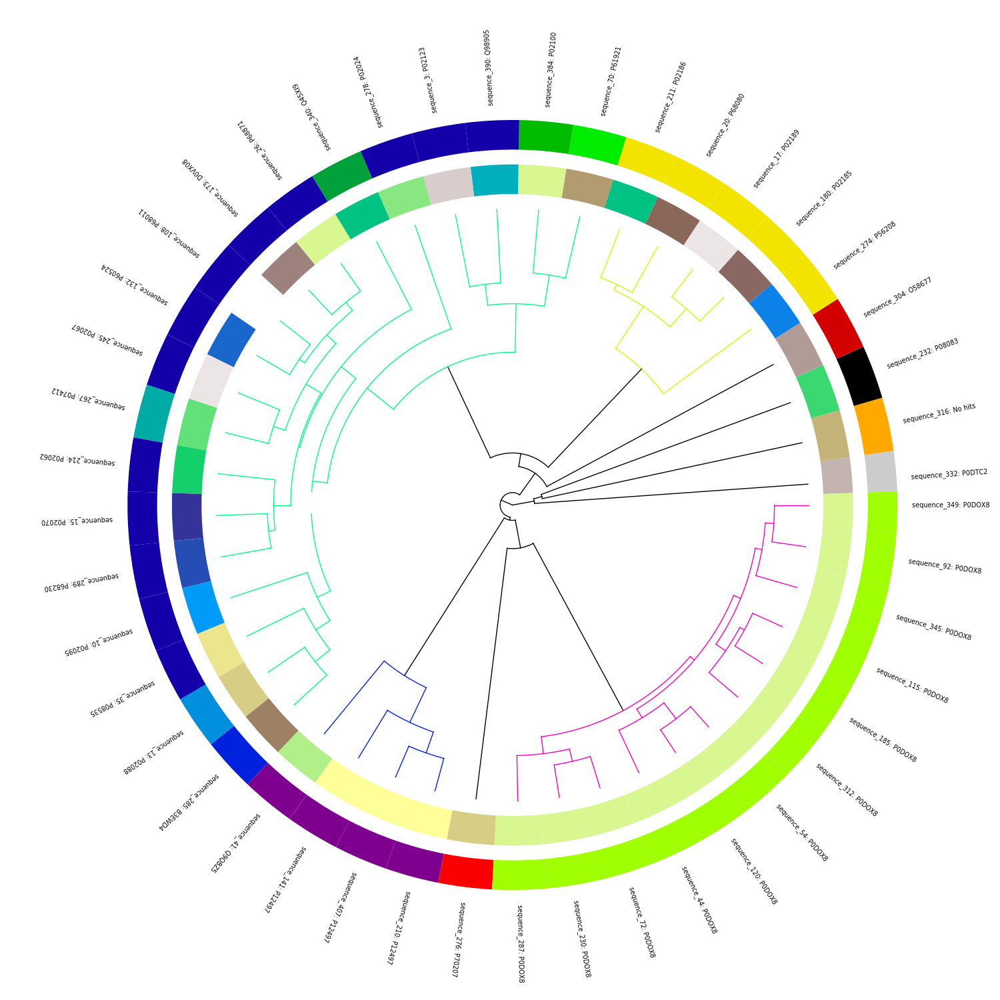

In [676]:
plt.close('all')
fig, ax = plt.subplots(figsize=(15, 15))
sample_classes_45 = {
    "protein": [dendrogram_df[dendrogram_df['qname'] == i]['protein_name'].values[0] for i in muscle_df_ref_uniprot.index],
    "species": [dendrogram_df[dendrogram_df['qname'] == i]['sciname'].values[0] for i in muscle_df_ref_uniprot.index],
}
radialTreee(Z2_ref_uniprot, ax=ax, sample_classes=sample_classes_45)

plt.savefig(input_dir+'cd_hit_uniprot_classes.png', dpi=300, bbox_inches='tight')
plt.show()

In [642]:
# for x in muscle_df_ref_uniprot.columns:
#     if 'P0DOX8' in x:
# #         print(x)
#         colorprint(top_hits_df[(top_hits_df['accession'] == 'P0DOX8') & (top_hits_df['query_title']==x.split(' ')[0])]['hseq'].values[0], 'red')
#         colorprint(top_hits_df[(top_hits_df['accession'] == 'P0DOX8') & (top_hits_df['query_title']==x.split(' ')[0])]['qseq'].values[0], 'green')
#         colorprint(reference_df[reference_df['sequence_id'] == int(x.split(' ')[0].split('_')[1])]['sequence'].values[0], 'blue')
#         print()

In [834]:
for g, n in dendrogram_df.groupby(by='leaf_color'):
#     print(n['query_title'].values)
    cid = [reference_df[reference_df['sequence_id'] == int(i.split('_')[1])]['cluster_id'].values[0] for i in n['query_title'].values]
    print(cid)
#     print(g)
#     print([a for i in cid for a in cd_dict[i]])
#     print()

['Cluster 6', 'Cluster 40', 'Cluster 26', 'Cluster 24', 'Cluster 23']
['Cluster 12', 'Cluster 7', 'Cluster 25', 'Cluster 5']
['Cluster 13', 'Cluster 42', 'Cluster 43', 'Cluster 9', 'Cluster 38', 'Cluster 41', 'Cluster 1', 'Cluster 37', 'Cluster 36', 'Cluster 20', 'Cluster 21', 'Cluster 44', 'Cluster 16', 'Cluster 11', 'Cluster 39', 'Cluster 19', 'Cluster 35', 'Cluster 15', 'Cluster 22']
['Cluster 34', 'Cluster 0', 'Cluster 2', 'Cluster 32', 'Cluster 33']
['Cluster 28', 'Cluster 31', 'Cluster 10', 'Cluster 29', 'Cluster 27', 'Cluster 4', 'Cluster 17', 'Cluster 30', 'Cluster 3', 'Cluster 14', 'Cluster 18', 'Cluster 8']


In [860]:
num_proteins

45

In [882]:
# specific_parent = []
# for i, k in zip(range(num_proteins), muscle_df_ref_uniprot.index):
# #     print(i, k)
#     parent_cid = reference_df[reference_df['sequence_id'] == int(k.split(':')[0].split('_')[1])]['cluster_id'].values[0]
#     parent_id = k.split(':')[0]  # parent_id
# #     child_id = 
# #     print('PARENT', parent_id)
    
#     for x, y in enumerate(cd_dict[parent_cid], num_proteins):
# #         print(x, y)
#         if not parent_id == y:
#             print('CHILD', y, x)
            
#             specific_parent.append(i)
#             child_similarity = sorted_muscle_df.loc[parent_id][x]
# # #             print(child_similarity)
# #             G.add_node(x)
# #             G.add_edge(i, x, weight=child_similarity)
#     print('***********************************************')

In [877]:
np.unique(specific_parent)

array([ 1,  3,  4,  8,  9, 11, 13, 14, 16, 17, 18, 23, 24, 27, 30, 31, 34,
       35, 36, 37, 40, 41, 44])

Graph with 23 nodes and 253 edges


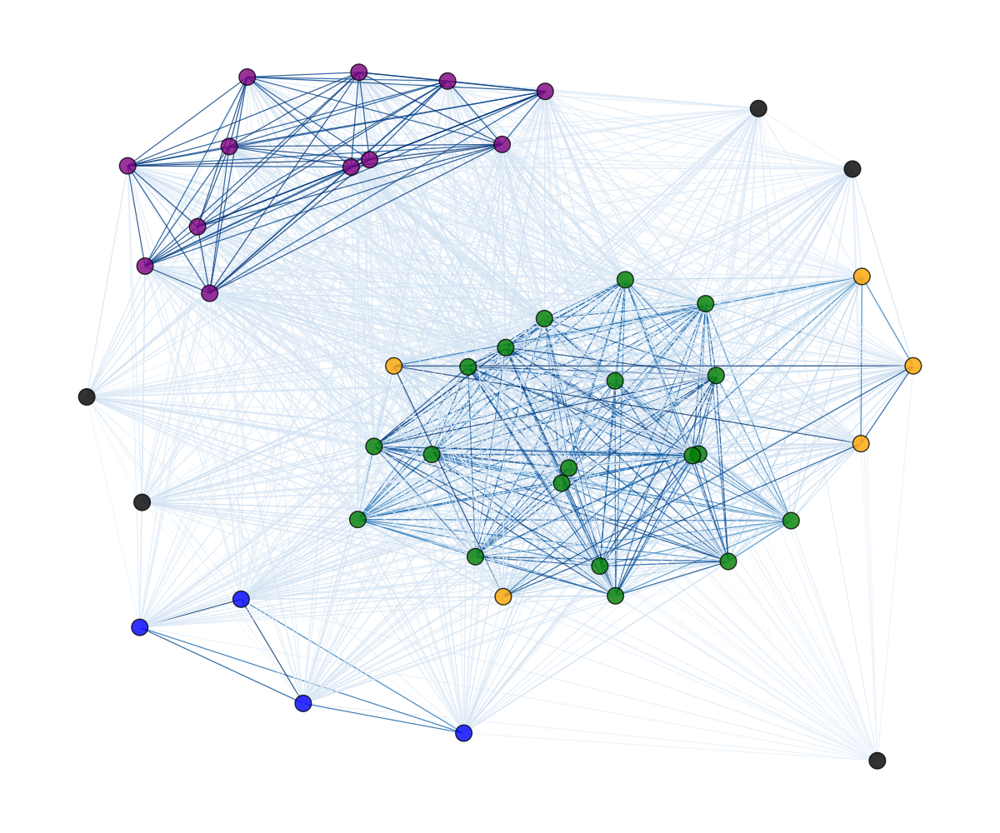

In [879]:

plt.close('all')

# Draw the network
plt.figure(figsize=(12, 10))  # Adjust width and height as needed
G = nx.Graph()
# threshold = 15
# Add nodes to the graph

# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = muscle_df_ref_uniprot.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        similarity_score = muscle_df_ref_uniprot.iloc[i, j]
        if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
#             print(i, j, similarity_score)
            G.add_edge(i, j, weight=similarity_score)
#         if similarity_score > threshold:  # Set the threshold here
#             G.add_edge(i, j, weight=similarity_score)
# # # Draw the network
pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm


# print(pos)

# # Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.Blues  # Choose the colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

species_class = {x: y for x, y in zip(range(0, len(muscle_df_ref_uniprot.index)), [dendrogram_df[dendrogram_df['qname'] == i]['leaf_color'].values[0] for i in muscle_df_ref_uniprot.index])}
# species_class


for i, k in zip(range(num_proteins), muscle_df_ref_uniprot.index):
#     print(i, k)
    parent_cid = reference_df[reference_df['sequence_id'] == int(k.split(':')[0].split('_')[1])]['cluster_id'].values[0]
    parent_id = k.split(':')[0]  # parent_id
#     child_id = 
#     print('PARENT', parent_id)
    for x, y in enumerate(cd_dict[parent_cid], num_proteins):
        if not parent_id == y:
#             print('CHILD', y, x)
            child_similarity = sorted_muscle_df.loc[parent_id][x]
#             print(child_similarity)
            G.add_node(x)
            G.add_edge(i, x, weight=child_similarity)




nx.draw(G, pos, with_labels=False, node_size=200, nodelist=species_class.keys(), node_color=list(species_class.values()), 
        edge_color=edge_weights, width=0.9, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')





# cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), shrink=0.8)
# cbar.set_label('Similarity Score', fontsize=20)


# # Create custom legend handles
# custom_legend = [Line2D([0], [0], color='red', linestyle='-', marker='o', markersize=20),
#                  Line2D([0], [0], color='lightblue', linestyle='--', marker='o', markersize=20)]

# # Create custom legend labels
legend_labels = ['sequences', 'CD-HIT cluster (≥ 90%)']
# # Add legend with custom handles and labels

# plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=20, ncol=2)
cbar.ax.tick_params(labelsize=20)
# plt.title("Protein Similarity Network")
# plt.savefig(input_dir+'Network_graph.png', dpi=300)
plt.show()

In [938]:
sorted_muscle_df.loc['sequence_180']['sequence_7']

98.7

In [940]:
sorted_muscle_df.iloc[179, 6]

98.7

In [942]:
# for x, y in cd_dict.items():
# #     print(x, y)
#     ref_ind = reference_df[reference_df['cluster_id'] == x]['sequence_id'].values[0] - 1
#     for item in y:
#         child_ind = int(item.split('_')[1])-1
#         if not child_ind == ref_ind:
#             similarity_score_child = sorted_muscle_df.iloc[ref_ind, child_ind]
#             print(ref_ind, child_ind, similarity_score_child)

In [963]:
# list(dendrogram_df['query_title'])

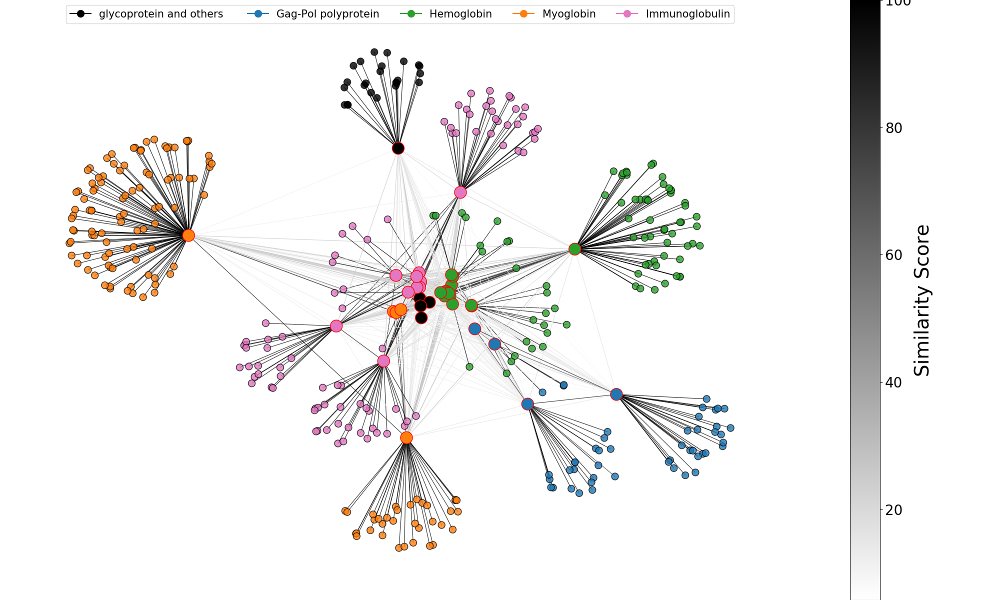

In [1036]:
import networkx as nx
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

plt.close('all')

# sorted_muscle_df = sorted_muscle_df.apply(lambda x)
# Create a graph

# Draw the network
plt.figure(figsize=(20, 12))  # Adjust width and height as needed
G = nx.Graph()
# threshold = 15
# Add nodes to the graph

# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = sorted_muscle_df.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# PARENT ---------------------------------------------------------
            
# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        
        i_ref = i + 1
        j_ref = j + 1
        if i_ref in list(reference_df['sequence_id']):
            if j_ref in list(reference_df['sequence_id']):
                similarity_score = sorted_muscle_df.iloc[i, j]
#                 print(i_ref, j_ref, similarity_score)
                
                if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
                    G.add_edge(i, j, weight=similarity_score)
                
ref_colormap = {}
for i in range(num_proteins):
#     print('sequence_'+str(i+1))
    ref = 'sequence_'+str(i+1)
    if ref in list(dendrogram_df['query_title']):
#         print(i)
#         print(i, ref, dendrogram_df[dendrogram_df['query_title'] == ref]['leaf_color'].values[0])
        ref_colormap.update({i: dendrogram_df[dendrogram_df['query_title'] == ref]['leaf_color'].values[0]})
    
    
    
# CHILD --------------------------------------------------------------

child_colormap = {}

for x, y in cd_dict.items():
#     print(x, y)
    ref_ind = reference_df[reference_df['cluster_id'] == x]['sequence_id'].values[0] - 1
    for item in y:
        child_ind = int(item.split('_')[1])-1
        if not child_ind == ref_ind:
#             print(ref_ind, child_ind)
            child_colormap.update({child_ind: ref_colormap[ref_ind]})
            similarity_score_child = sorted_muscle_df.iloc[ref_ind, child_ind]
            if min_threshold <= similarity_score_child <= max_threshold:  # Only add edges within the range
                G.add_edge(ref_ind, child_ind, weight=similarity_score_child)
                
full_colormap = {}
full_colormap.update(ref_colormap)
full_colormap.update(child_colormap)

sorted_colormap = {i: full_colormap[i] for i in range(num_proteins)}

# DRAW''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''

pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.binary  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# # Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_size=100, nodelist=sorted_colormap.keys(), node_color=list(sorted_colormap.values()), 
        edge_color=edge_weights, width=0.9, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')


cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap))
cbar.set_label('Similarity Score', fontsize=28)

# # # Draw specific nodes with their specified colors
nx.draw_networkx_nodes(G, pos, nodelist=ref_colormap.keys(), node_color=list(ref_colormap.values()), node_size=300, edgecolors='red')


# Create custom legend handles
custom_legend = [Line2D([0], [0], color='black', marker='o', markersize=10),
                 Line2D([0], [0], color='tab:blue', marker='o', markersize=10),
                Line2D([0], [0], color='tab:green', marker='o', markersize=10),
                Line2D([0], [0], color='tab:orange', marker='o', markersize=10),
                Line2D([0], [0], color='tab:pink', marker='o', markersize=10),]

# Create custom legend labels
legend_labels = ['glycoprotein and others ', 'Gag-Pol polyprotein', 'Hemoglobin', 'Myoglobin', 'Immunoglobulin']
# Add legend with custom handles and labels

plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=15, ncol=5)
cbar.ax.tick_params(labelsize=20)
plt.title("Protein Similarity Network")

plt.show()

In [1037]:
plt.savefig(input_dir+'final_network.png', dpi=300, bbox_inches='tight')

In [1000]:
np.unique(list(sorted_colormap.values()))

array(['black', 'blue', 'green', 'orange', 'purple'], dtype='<U6')

In [1005]:
dendrogram_df[dendrogram_df['leaf_color'] == 'black']

,color_code,qname,leaf_color,query_title,accession,protein_name,sciname
0,C0,sequence_332: P0DTC2,black,sequence_332,P0DTC2,Spike glycoprotein,Severe acute respiratory syndrome coronavirus 2
1,C0,sequence_316: No hits,black,sequence_316,No hits,None,None
2,C0,sequence_232: P08083,black,sequence_232,P08083,Colicin-N,Escherichia coli
3,C0,sequence_304: O58677,black,sequence_304,O58677,Ribulose bisphosphate carboxylase,Pyrococcus horikoshii OT3
32,C0,sequence_276: P70207,black,sequence_276,P70207,Plexin-A2,Mus musculus


In [1024]:
# cd_dict[reference_df[reference_df['sequence_id'] == 332]['cluster_id'].values[0]]

In [1025]:
for m, n in dendrogram_df.groupby('leaf_color'):
    print(m, list(n['protein_name']))

black ['Spike glycoprotein', 'None', 'Colicin-N ', 'Ribulose bisphosphate carboxylase', 'Plexin-A2']
blue ['Gag-Pol polyprotein', 'Gag-Pol polyprotein', 'Gag-Pol polyprotein', 'Gag-Pol polyprotein']
green ['Hemoglobin subunit gamma-2', 'Hemoglobin subunit epsilon', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit delta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta-A/B', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta', 'Hemoglobin subunit beta-1', 'Hemoglobin subunit beta ']
orange ['Myoglobin ', 'Myoglobin ', 'Myoglobin ', 'Myoglobin ', 'Myoglobin ']
purple ['Immunoglobulin lambda-1 light chain', 'Immunoglobulin lambda-1 light chain', 'Immunoglobulin lambda-1 light chain', 'Immunoglobulin lambda-1 light chain', 'Immunoglobulin lambda-1 